# ANALISIS DE VENTAS EN AMAZON PARA UNA EMPRESA

# ABSTRACT

# DEFINICION DEL OBJETIVO

El objetivo principal del trabajo es poder predecir la estacionalidad de la venta de los productos de la empresa, tanto durante las distintas estaciones del año como cuando suceden fenómenos externos significativos como el inicio de la pandemia, guerras, y otros. Tambien nos interesa saber el impacto real en las ventas de las visitas totales a las publicaciones para poder maximizar los presupuestos de publicidad y pay-per-click.

# CONTEXTO ANALITICO

# PREGUNTAS e HIPOTESIS

El dataset elegido corresponde a las ventas por dia en la plataforma AMAZON de una empresa que cuenta con una linea de productos. Dentro del dataset hay informacion sobre las unidades vendidas, las visitas a las publicaciones. En principio establecemos las siguientes hipotesis:

1) Las unidades vendidas son directamente proporcionales a la cantidad de visitas.
2) Los productos tienen una estacionalidad positiva en el verano (de Junio a Septiembre)
3) LAs horas de luz del dia, pueden afectar el comportamiento de los consumidores
4) El inicio de la pandemia (Marzo 2020) y el inicio de la guerra de Ucrania (FEB-MAR 2022) afectaron a las ventas

# ANALISIS EXPLORATORIO DE LOS DATOS 

A continuación se realizará un análisis exploratorio de los datos para comenzar a encontrar patrones, carácteristicas y correlaciones en los datos


In [1]:
# VENTAS DE PRODUCTOS EN MERCADO LIBRE PARA LA EMPRESA SELECCIONADA
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels
from scipy import stats
from pingouin import pairwise_ttests #this is for performing the pairwise tests
from datetime import datetime, timedelta
from matplotlib import dates as mpl_dates
from mpl_toolkits.mplot3d import Axes3D
import bokeh
from bokeh.plotting import figure




In [2]:
mi_csv_F="SALES DATA 2020-2023.csv"

AmzProd=pd.read_csv(mi_csv_F,sep=',')
AmzProd.head(3)

,Date,Sales ($) Heartbeat Hot Sauce,Sales (units) Heartbeat Hot Sauce,Avg item price ($/unit) Heartbeat Hot Sauce,Sessions Heartbeat Hot Sauce,Page Views Heartbeat Hot Sauce,Sales ($) Medentech,Sales (units) Medentech,Avg item price ($/unit) Medentech,Sessions Medentech,...,Total Sales (units),Avg item price ($/unit),Total Sessions,Total Page Views,max_temperature,avg_temperature,min_temperature,rain,snow,daylight
0,1/1/2020,182.28,8,22.79,84,110,372.34,22,16.92,77,...,37,26.020000,176,246,-0.2,-1.70,-3.2,0.0,0.0,8.98
1,1/2/2020,290.88,10,29.09,108,136,427.34,30,14.24,93,...,43,29.253333,212,278,6.4,2.95,-0.5,0.0,0.0,8.98
2,1/3/2020,229.79,11,20.89,61,72,497.84,29,17.17,115,...,50,27.380000,195,263,6.8,4.55,2.3,0.0,0.0,9.00


In [3]:
print(AmzProd.shape) #VEMOS LA FORMA DEL DATASET

(1399, 27)


In [4]:
AmzProd.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1399 entries, 0 to 1398
Data columns (total 27 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Date                                         1399 non-null   object 
 1   Sales ($) Heartbeat Hot Sauce                1399 non-null   float64
 2   Sales (units) Heartbeat Hot Sauce            1399 non-null   int64  
 3   Avg item price ($/unit) Heartbeat Hot Sauce  1399 non-null   float64
 4   Sessions Heartbeat Hot Sauce                 1399 non-null   int64  
 5   Page Views Heartbeat Hot Sauce               1399 non-null   int64  
 6   Sales ($) Medentech                          1399 non-null   float64
 7   Sales (units) Medentech                      1399 non-null   int64  
 8   Avg item price ($/unit) Medentech            1399 non-null   float64
 9   Sessions Medentech                           1399 non-null   int64  
 10  

D:\New folder\New folder\Lib\site-packages\outdated\utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.3, the latest is 0.5.4.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [5]:
#COMO HAY UNA SOLA LINEA CON VALORES ERRONEOS O FALTANTES DE 1399 FILAS TOTALES 


In [6]:
AmzProd.describe()

,Sales ($) Heartbeat Hot Sauce,Sales (units) Heartbeat Hot Sauce,Avg item price ($/unit) Heartbeat Hot Sauce,Sessions Heartbeat Hot Sauce,Page Views Heartbeat Hot Sauce,Sales ($) Medentech,Sales (units) Medentech,Avg item price ($/unit) Medentech,Sessions Medentech,Page Views Medentech,...,Total Sales (units),Avg item price ($/unit),Total Sessions,Total Page Views,max_temperature,avg_temperature,min_temperature,rain,snow,daylight
count,1399.000000,1399.000000,1399.000000,1399.000000,1399.000000,1399.000000,1399.000000,1399.000000,1399.000000,1399.000000,...,1399.000000,1399.000000,1399.000000,1399.000000,1399.000000,1399.000000,1399.000000,1399.000000,1399.000000,1399.000000
mean,1257.730600,47.238742,26.465325,263.573981,357.285919,1108.669721,52.384560,20.957241,222.441744,291.690493,...,120.356683,31.407034,575.315225,766.499643,14.658542,10.051858,5.446891,1.781916,0.375340,12.342924
std,1090.895174,37.716530,4.506727,275.424012,378.344971,919.856846,40.618106,1.784662,180.668606,240.935639,...,50.818276,2.535014,439.419996,586.621969,11.099068,10.312795,9.799494,4.979956,1.789382,2.204986
min,100.140000,6.000000,16.300000,0.000000,0.000000,18.070000,1.000000,14.240000,0.000000,0.000000,...,25.000000,20.813333,0.000000,0.000000,-13.100000,-17.100000,-21.800000,0.000000,0.000000,8.920000
25%,663.940000,26.000000,23.345000,89.500000,118.500000,672.785000,32.000000,19.820000,87.500000,113.000000,...,89.000000,29.710000,257.000000,335.500000,4.750000,1.425000,-2.000000,0.000000,0.000000,10.300000
50%,985.090000,38.000000,26.080000,195.000000,270.000000,941.580000,45.000000,20.880000,198.000000,253.000000,...,111.000000,31.190000,532.000000,714.000000,15.100000,10.300000,5.600000,0.000000,0.000000,12.430000
75%,1379.550000,53.000000,28.920000,366.000000,482.000000,1246.655000,59.000000,21.995000,351.500000,457.500000,...,138.000000,33.026667,895.000000,1172.500000,24.650000,19.475000,14.300000,0.600000,0.000000,14.470000
max,7288.670000,260.000000,46.190000,1677.000000,2303.000000,14464.300000,625.000000,28.360000,1323.000000,1859.000000,...,655.000000,40.653333,2334.000000,3170.000000,35.500000,28.400000,23.700000,59.000000,29.200000,15.470000


In [7]:
df=AmzProd


In [8]:
#agrego las columnas año, mes y dia de la semana weekday para futuros analisis

df['Month'] = pd.DatetimeIndex(df['Date']).month
df['Year'] = pd.DatetimeIndex(df['Date']).year
df['weekday']= pd.DatetimeIndex(df['Date']).weekday
df.head(3)

,Date,Sales ($) Heartbeat Hot Sauce,Sales (units) Heartbeat Hot Sauce,Avg item price ($/unit) Heartbeat Hot Sauce,Sessions Heartbeat Hot Sauce,Page Views Heartbeat Hot Sauce,Sales ($) Medentech,Sales (units) Medentech,Avg item price ($/unit) Medentech,Sessions Medentech,...,Total Page Views,max_temperature,avg_temperature,min_temperature,rain,snow,daylight,Month,Year,weekday
0,1/1/2020,182.28,8,22.79,84,110,372.34,22,16.92,77,...,246,-0.2,-1.70,-3.2,0.0,0.0,8.98,1,2020,2
1,1/2/2020,290.88,10,29.09,108,136,427.34,30,14.24,93,...,278,6.4,2.95,-0.5,0.0,0.0,8.98,1,2020,3
2,1/3/2020,229.79,11,20.89,61,72,497.84,29,17.17,115,...,263,6.8,4.55,2.3,0.0,0.0,9.00,1,2020,4


In [10]:
#Paso la fecha al indice

df['Date']= pd.to_datetime(df['Date'], format = '%m/%d/%Y')
df.index = df['Date']
dfCOPY=df
df = df.drop('Date',axis='columns')
df.head()

,Sales ($) Heartbeat Hot Sauce,Sales (units) Heartbeat Hot Sauce,Avg item price ($/unit) Heartbeat Hot Sauce,Sessions Heartbeat Hot Sauce,Page Views Heartbeat Hot Sauce,Sales ($) Medentech,Sales (units) Medentech,Avg item price ($/unit) Medentech,Sessions Medentech,Page Views Medentech,...,Total Page Views,max_temperature,avg_temperature,min_temperature,rain,snow,daylight,Month,Year,weekday
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-01,182.28,8,22.79,84,110,372.34,22,16.92,77,109,...,246,-0.2,-1.70,-3.2,0.0,0.0,8.98,1,2020,2
2020-01-02,290.88,10,29.09,108,136,427.34,30,14.24,93,122,...,278,6.4,2.95,-0.5,0.0,0.0,8.98,1,2020,3
2020-01-03,229.79,11,20.89,61,72,497.84,29,17.17,115,168,...,263,6.8,4.55,2.3,0.0,0.0,9.00,1,2020,4
2020-01-04,155.92,8,19.49,64,82,433.40,29,14.94,103,142,...,252,2.5,0.90,-0.7,0.0,2.4,9.02,1,2020,5
2020-01-05,259.76,14,18.55,58,81,624.07,39,16.00,161,233,...,346,1.3,-0.74,-2.8,0.0,3.6,9.05,1,2020,6


In [11]:
mpl.style.use('bmh')

Text(0, 0.5, 'ventas en unidades')

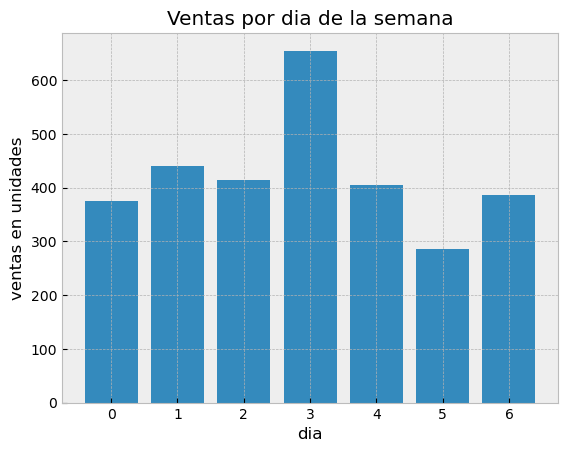

In [12]:
#EMPEZAMOS VIENDO LAS VENTAS SEGUN EL DIA DE LA SEMANA

plt.bar(df['weekday'],df["Total Sales (units)"])
plt.title('Ventas por dia de la semana')
ax6 = plt.subplot()  # Axis
ax6.set_xlabel('dia')
ax6.set_ylabel('ventas en unidades')

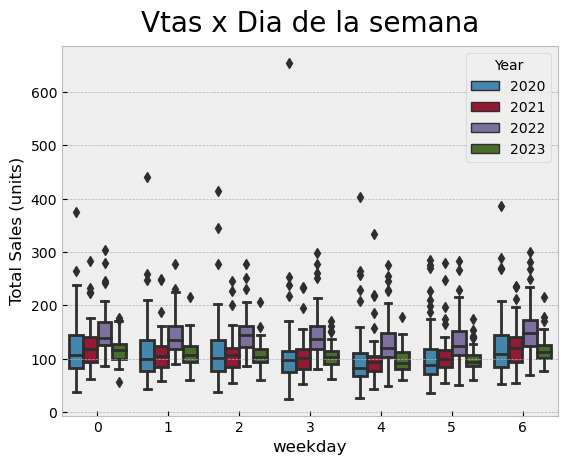

In [13]:
#ANALIZAMOS LA EVOLUCION DE CADA PERIODO

sns.boxplot(x='weekday', y = 'Total Sales (units)', data = df, hue='Year') 
plt.title("Vtas x Dia de la semana", fontsize=20, verticalalignment='bottom');

SE OBSERVA UN CRECIMIENTO EN LAS VENTAS TOTALES, DISTRIBUIDO DE MANERA MUY SIMILAR EN LOS DOSTONTOS AÑOS PARA LOS DIAS DE LA SEMANA

# storytelling

El presente analisis de datos esta orientado a los gerentes de ventas y C-level de la empresa.
LA pregunta que queremos responder es si existe relacion entre las variables de ventas de productos y aspectos climaticos, visualizaciones, estaciones del año y otros aspectos que se iran agregando de manera acumulativa en los analisis.

En caso de existir dichas relaciones, intentaremos establecer un modelo que nos permita predecir las ventas bajo una combinacion dada de diversos factores, y de esa manera poder realizar una planificacion de abastecimiento, planificacion financiera, planificacion de recursos humanos y logistica, asociadas a los pronostocos de ventas.

    

# ANALIZAMOS LA CORRELACION ENTRE LAS VARIABLES

In [14]:
df.corr()

,Sales ($) Heartbeat Hot Sauce,Sales (units) Heartbeat Hot Sauce,Avg item price ($/unit) Heartbeat Hot Sauce,Sessions Heartbeat Hot Sauce,Page Views Heartbeat Hot Sauce,Sales ($) Medentech,Sales (units) Medentech,Avg item price ($/unit) Medentech,Sessions Medentech,Page Views Medentech,...,Total Page Views,max_temperature,avg_temperature,min_temperature,rain,snow,daylight,Month,Year,weekday
Sales ($) Heartbeat Hot Sauce,1.000000,0.985898,0.178692,0.606278,0.598093,-0.158152,-0.154785,-0.113356,-0.150619,-0.154204,...,0.275324,-0.332259,-0.318761,-0.294665,-0.017716,0.087893,-0.485311,0.408037,-0.043950,0.009313
Sales (units) Heartbeat Hot Sauce,0.985898,1.000000,0.044389,0.627647,0.621970,-0.137305,-0.135217,-0.086963,-0.133543,-0.136759,...,0.293678,-0.340084,-0.326347,-0.301765,-0.019698,0.097664,-0.499628,0.398518,-0.076687,0.003635
Avg item price ($/unit) Heartbeat Hot Sauce,0.178692,0.044389,1.000000,0.000104,-0.015568,-0.180764,-0.163257,-0.228423,-0.073222,-0.082043,...,0.003277,0.041934,0.043321,0.043679,0.038916,-0.025808,0.060799,0.130141,0.405280,0.023390
Sessions Heartbeat Hot Sauce,0.606278,0.627647,0.000104,1.000000,0.990667,-0.054175,-0.050549,-0.030975,0.423402,0.412187,...,0.854109,-0.240078,-0.220896,-0.193062,-0.014600,0.058352,-0.371178,0.304757,0.172736,0.045235
Page Views Heartbeat Hot Sauce,0.598093,0.621970,-0.015568,0.990667,1.000000,-0.056405,-0.055234,-0.004428,0.400746,0.389810,...,0.847808,-0.223932,-0.204555,-0.176943,-0.007959,0.063329,-0.356584,0.319307,0.126908,0.042069
Sales ($) Medentech,-0.158152,-0.137305,-0.180764,-0.054175,-0.056405,1.000000,0.993723,0.232018,0.492714,0.515737,...,0.181322,-0.043175,-0.042880,-0.041366,-0.012460,0.016136,0.031799,-0.159183,-0.015090,-0.038148
Sales (units) Medentech,-0.154785,-0.135217,-0.163257,-0.050549,-0.055234,0.993723,1.000000,0.149472,0.501637,0.523554,...,0.189673,-0.044390,-0.042740,-0.039700,-0.015273,0.018373,0.027235,-0.162925,0.027465,-0.039066
Avg item price ($/unit) Medentech,-0.113356,-0.086963,-0.228423,-0.030975,-0.004428,0.232018,0.149472,1.000000,0.058373,0.063872,...,0.004634,0.095669,0.077726,0.055289,0.032697,-0.029578,0.138554,0.017462,-0.279509,-0.018448
Sessions Medentech,-0.150619,-0.133543,-0.073222,0.423402,0.400746,0.492714,0.501637,0.058373,1.000000,0.997123,...,0.803488,0.037337,0.042499,0.047170,-0.012200,0.007442,0.095240,-0.087842,0.430564,0.037732
Page Views Medentech,-0.154204,-0.136759,-0.082043,0.412187,0.389810,0.515737,0.523554,0.063872,0.997123,1.000000,...,0.793421,0.021462,0.026372,0.031204,-0.013208,0.011960,0.087386,-0.108405,0.412932,0.037551


<Axes: >

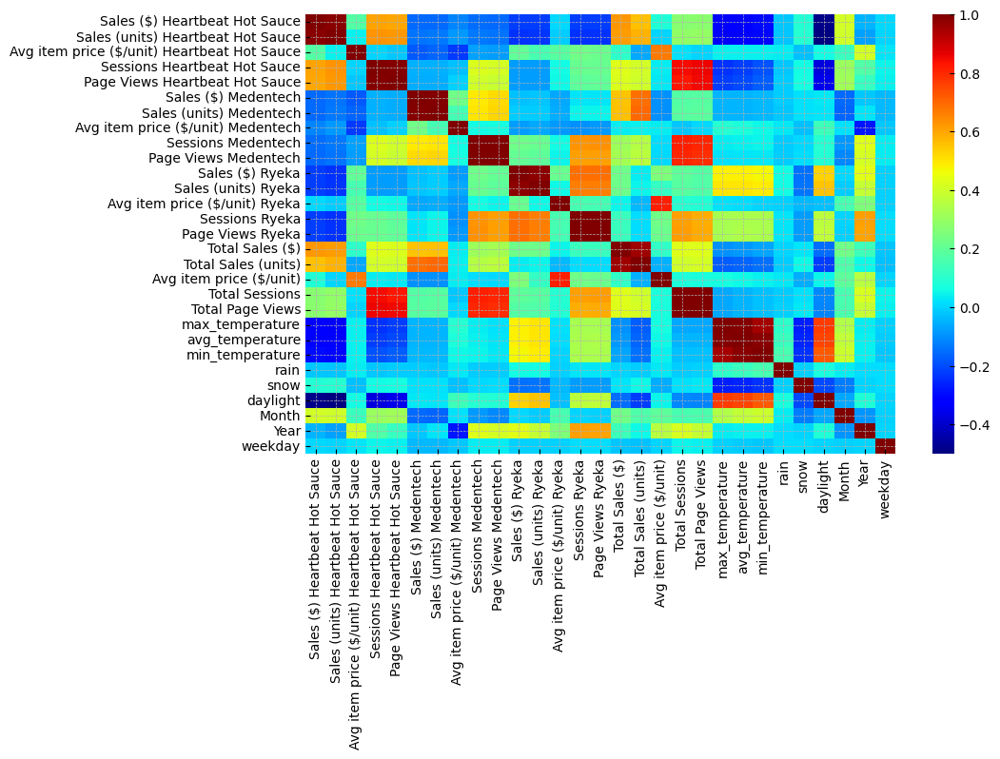

In [15]:
plt.figure(figsize=(10,6))
sns.heatmap(data=df.corr(), cmap='jet')

En este grafico se observa que la mayoria de las correlaciones fuertes son de variables que expresan cosas similares u obvias, como por ejemplo las horas de lux y las temperaturas, o las sesiones con las page views de los usuarios.
Pero podemos identficar algunas correlaciones mas leves que podrian ayudar a encarar el analisis:
-Correlacion negativa entre Daylight con Ventas de la marca heartbeat.
-Correlacion positiva entre la temperatura y las ventas de la marca Ryeka.


# AGRUPACIONES POR AÑO Y MES PARA EL ANALISIS POR ESTACIONALIDAD

In [16]:
#VOY A TOMAR LOS DATOS RELEVANTES AGRUPADO POR AÑO Y MES


DatosRelevantes = df.groupby(['Year', 'Month']).agg({
    'Total Sales (units)': ['sum'],'Sales (units) Heartbeat Hot Sauce': ['sum'],'Sales (units) Medentech': ['sum'],'Sales (units) Ryeka': ['sum'],
    'Total Page Views': ['sum'],'Page Views Heartbeat Hot Sauce': ['sum'],'Page Views Medentech': ['sum'],'Page Views Ryeka': ['sum'],
    'max_temperature': ['mean'],'daylight':['mean']})

DatosRelevantes = DatosRelevantes.set_axis(['Total Sales','Sales HB','Sales MED','Sales RYE','Total Page Views','Page Views HB','Page Views MED','Page Views RYE','avg Max Temp','Daylight hs'],axis='columns',copy=False)
DatosRelevantes


Total Sales  Sales HB  Sales MED  Sales RYE  Total Page Views  \
Year Month                                                                  
2020 1             1610       338       1074      198.0              9778   
     2             2739       553       1888      298.0             16325   
     3             7600       712       6534      354.0             29911   
     4             3015      1025       1554      436.0             17906   
     5             2387       850        956      581.0             15561   
     6             2869       864       1249      756.0             19005   
     7             3600       909       1860      831.0             23208   
     8             3795       980       2122      693.0             22644   
     9             2617       930       1256      431.0             18092   
     10            2526      1170        971      385.0             16602   
     11            3832      2520        892      420.0             35829   
     12            5170      3963        834      373.0             31231   
2021 1             3459      1562       1310      587.0             18147   
     2             2794      1640        613      541.0              8870   
     3             2263      1343        376      544.0              1530   
     4             2981      1413        905      663.0              2013   
     5             2821      1279        797      745.0              2425   
     6             2377      1104        621      652.0              4220   
     7             3347      1283       1324      740.0              4320   
     8             3508      1323       1443      742.0              4333   
     9             3239      1284       1378      577.0              4409   
     10            3641      1443       1818      380.0              5813   
     11            4557      2614       1541      402.0             11704   
     12            5805      4478       1012      315.0             13337   
2022 1             4195      2310       1468      417.0             11987   
     2             3486      1334       1933      219.0              8234   
     3             5943      1197       4267      479.0             16894   
     4             3832      1292       1986      554.0             27597   
     5             3638      1085       1875      678.0             35851   
     6             3827      1386       1552      889.0             34365   
     7             4367      1223       1970     1174.0             39081   
     8             4583      1288       2058     1237.0             36603   
     9             4140      1377       1907      856.0             38873   
     10            4253      1662       2134      457.0             42934   
     11            4837      3165       1278      394.0             54090   
     12            5964      4736        895      333.0             61935   
2023 1             3753      1643       1505      605.0             48613   
     2             4188      1402       2144      642.0             44988   
     3             3471      1047       1711      713.0             38429   
     4             2887       661       1318      908.0             31865   
     5             2924       550       1229     1145.0             27749   
     6             3227       617       1555     1055.0             29630   
     7             3522       665       1671     1186.0             32096   
     8             3316       600       1762      954.0             29040   
     9             2817       640       1278      899.0             24070   
     10            2657       627       1462      568.0             20196   

            Page Views HB  Page Views MED  Page Views RYE  avg Max Temp  \
Year Month                                                                
2020 1               3027            6062           689.0      1.780645   
     2               5181            9687          1457.0      0.537931   
     3         

In [17]:
#GENERO UN DATAFRAME CON LA DATA RELEVANTE AGRUPADA
DFdatosrel = pd.DataFrame(DatosRelevantes)
DFdatosrel= DFdatosrel.reset_index()
DFdatosrel
DFdatosrel.info()
DFdatosrel

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46 entries, 0 to 45
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Year              46 non-null     int64  
 1   Month             46 non-null     int64  
 2   Total Sales       46 non-null     int64  
 3   Sales HB          46 non-null     int64  
 4   Sales MED         46 non-null     int64  
 5   Sales RYE         46 non-null     float64
 6   Total Page Views  46 non-null     int64  
 7   Page Views HB     46 non-null     int64  
 8   Page Views MED    46 non-null     int64  
 9   Page Views RYE    46 non-null     float64
 10  avg Max Temp      46 non-null     float64
 11  Daylight hs       46 non-null     float64
dtypes: float64(4), int64(8)
memory usage: 4.4 KB


,Year,Month,Total Sales,Sales HB,Sales MED,Sales RYE,Total Page Views,Page Views HB,Page Views MED,Page Views RYE,avg Max Temp,Daylight hs
0,2020,1,1610,338,1074,198.0,9778,3027,6062,689.0,1.780645,9.336452
1,2020,2,2739,553,1888,298.0,16325,5181,9687,1457.0,0.537931,10.490690
2,2020,3,7600,712,6534,354.0,29911,6162,22340,1409.0,7.293548,11.950645
3,2020,4,3015,1025,1554,436.0,17906,9340,6980,1586.0,10.716667,13.457000
4,2020,5,2387,850,956,581.0,15561,8035,4788,2738.0,17.293548,14.741290
5,2020,6,2869,864,1249,756.0,19005,8051,7421,3533.0,26.550000,15.398000
6,2020,7,3600,909,1860,831.0,23208,8894,10222,4092.0,30.351613,15.064839
7,2020,8,3795,980,2122,693.0,22644,10015,9421,3208.0,27.422581,13.934194
8,2020,9,2617,930,1256,431.0,18092,10858,5326,1908.0,22.036667,12.492667
9,2020,10,2526,1170,971,385.0,16602,10327,4744,1531.0,13.677419,10.993548


In [18]:
VentasxYear = df.groupby(['Year', 'Month'])[['Total Sales (units)','Sales (units) Heartbeat Hot Sauce','Sales (units) Medentech','Sales (units) Ryeka']].sum()
                                               
VentasxYear
#AGRUPAMOS PARA VER POR AÑO LAS VENTAS

Total Sales (units)  Sales (units) Heartbeat Hot Sauce  \
Year Month                                                           
2020 1                     1610                                338   
     2                     2739                                553   
     3                     7600                                712   
     4                     3015                               1025   
     5                     2387                                850   
     6                     2869                                864   
     7                     3600                                909   
     8                     3795                                980   
     9                     2617                                930   
     10                    2526                               1170   
     11                    3832                               2520   
     12                    5170                               3963   
2021 1                     3459                               1562   
     2                     2794                               1640   
     3                     2263                               1343   
     4                     2981                               1413   
     5                     2821                               1279   
     6                     2377                               1104   
     7                     3347                               1283   
     8                     3508                               1323   
     9                     3239                               1284   
     10                    3641                               1443   
     11                    4557                               2614   
     12                    5805                               4478   
2022 1                     4195                               2310   
     2                     3486                               1334   
     3                     5943                               1197   
     4                     3832                               1292   
     5                     3638                               1085   
     6                     3827                               1386   
     7                     4367                               1223   
     8                     4583                               1288   
     9                     4140                               1377   
     10                    4253                               1662   
     11                    4837                               3165   
     12                    5964                               4736   
2023 1                     3753                               1643   
     2                     4188                               1402   
     3                     3471                               1047   
     4                     2887                                661   
     5                     2924                                550   
     6                     3227                                617   
     7                     3522                                665   
     8                     3316                                600   
     9                     2817                                640   
     10                    2657                                627   

            Sales (units) Medentech  Sales (units) Ryeka  
Year Month                                                
2020 1                         1074                198.0  
     2                         1888                298.0  
     3                         6534                354.0  
     4                         1554                436.0  
     5                          956                581.0  
     6                         1249                756.0  
     7                         1860                831.0  
     8                         2122                693.0  
     9                         1256                431.0  
  

In [19]:
DFVentasTot = pd.DataFrame(VentasxYear)
DFVentasTot= DFVentasTot.reset_index()
DFVentasTot.info()
DFVentasTot


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46 entries, 0 to 45
Data columns (total 6 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Year                               46 non-null     int64  
 1   Month                              46 non-null     int64  
 2   Total Sales (units)                46 non-null     int64  
 3   Sales (units) Heartbeat Hot Sauce  46 non-null     int64  
 4   Sales (units) Medentech            46 non-null     int64  
 5   Sales (units) Ryeka                46 non-null     float64
dtypes: float64(1), int64(5)
memory usage: 2.3 KB


,Year,Month,Total Sales (units),Sales (units) Heartbeat Hot Sauce,Sales (units) Medentech,Sales (units) Ryeka
0,2020,1,1610,338,1074,198.0
1,2020,2,2739,553,1888,298.0
2,2020,3,7600,712,6534,354.0
3,2020,4,3015,1025,1554,436.0
4,2020,5,2387,850,956,581.0
5,2020,6,2869,864,1249,756.0
6,2020,7,3600,909,1860,831.0
7,2020,8,3795,980,2122,693.0
8,2020,9,2617,930,1256,431.0
9,2020,10,2526,1170,971,385.0


In [20]:
views = df.groupby(['Year', 'Month'])[['Total Page Views']].sum()


#AGRUPAMOS PARA VER POR AÑO LAS VISITAS

In [21]:
dfviews = df[["Total Page Views"]] 
dfsales = df[["Total Sales (units)"]] 


En un grafico de ventas por dia podemos obbservar la estacionalidad a lo largo del año
Luego pasaremos a un analisis que entre dentro de la estacionalidad, como son las visitas de la pagina web, 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


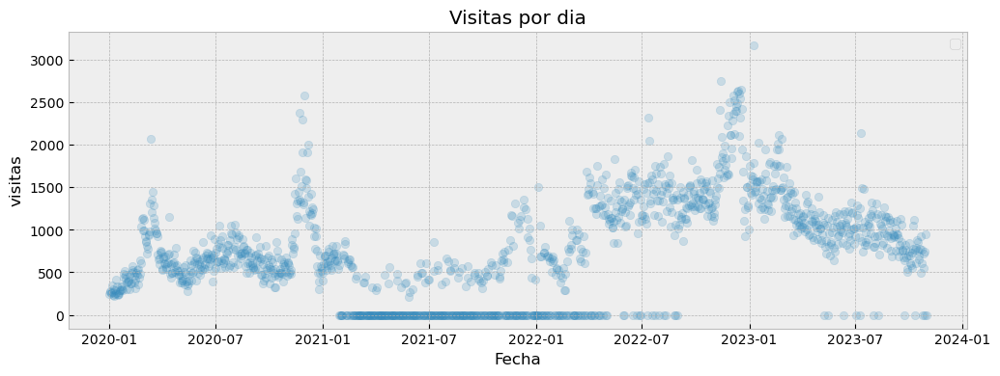

In [22]:
#Este grafico me mostrara la dispersion de total de visitas a las publicaciones por dia


fig, ax1 = plt.subplots(figsize=(12, 4)) # crea un objeto figura y un objeto ax
ax1.scatter(df.index, dfviews, alpha=0.2) # grafica los datos de alturas y pesos con grafico del tipo scatter
ax1.set_xlabel('Fecha') #es el nombre del eje x
ax1.set_ylabel('visitas') # es el nombre del eje y
ax1.set_title('Visitas por dia') #es el titulo de la figura
ax1.legend() 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


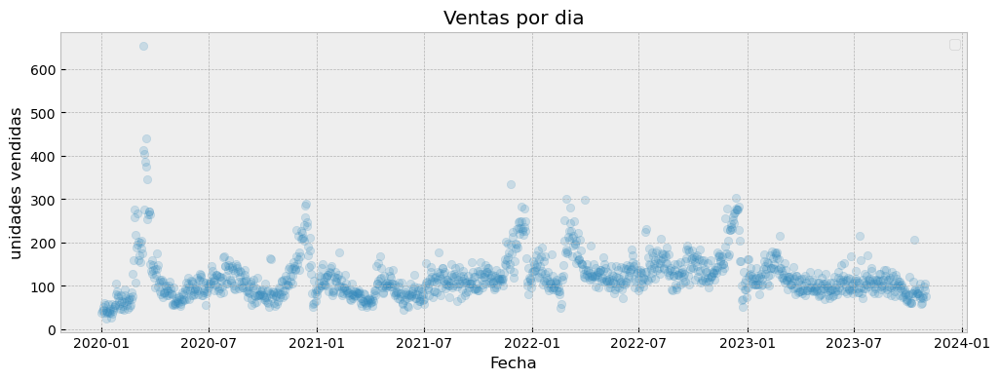

In [23]:
#Este grafico me mostrara la dispersion de total de UNIDADES VENDIDAS por dia

fig, ax3 = plt.subplots(figsize=(12, 4)) # crea un objeto figura y un objeto ax
ax3.scatter(df.index, dfsales, alpha=0.2) # grafica los datos de alturas y pesos con grafico del tipo scatter
ax3.set_xlabel('Fecha') #es el nombre del eje x
ax3.set_ylabel('unidades vendidas') # es el nombre del eje y
ax3.set_title('Ventas por dia') #es el titulo de la figura
ax3.legend() 

In [24]:
Years = df.Year.unique()
Years

array([2020, 2021, 2022, 2023], dtype=int64)

In [25]:
VIEWSbyyear = pd.DataFrame( df.groupby(['Year'])[['Total Page Views']].sum() , index= Years)
VIEWSbyyear

,Total Page Views
2020,256092
2021,81121
2022,408444
2023,326676


In [26]:
SALESbyyear = pd.DataFrame(df.groupby(['Year'])[['Total Sales (units)']].sum() , index= Years)
SALESbyyear



,Total Sales (units)
2020,41760
2021,40792
2022,53065
2023,32762


Text(0, 0.5, 'ventas en unidades')

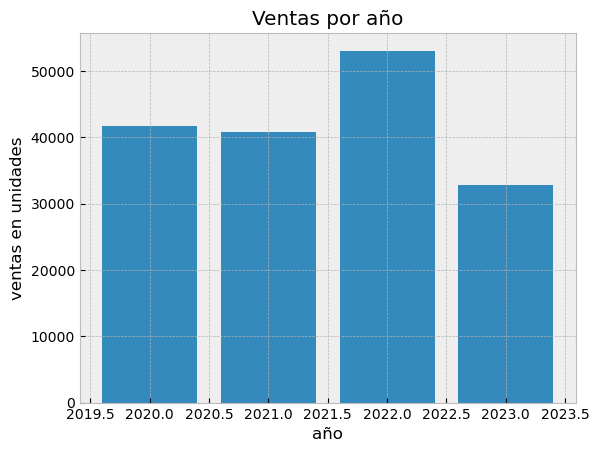

In [27]:
#Este grafico me mostrara las UNIDADES VENDIDAS por año

plt.bar(SALESbyyear.index,SALESbyyear["Total Sales (units)"])
plt.title('Ventas por año')
ax6 = plt.subplot()  # Axis
ax6.set_xlabel('año')
ax6.set_ylabel('ventas en unidades')

Text(0, 0.5, 'visitas')

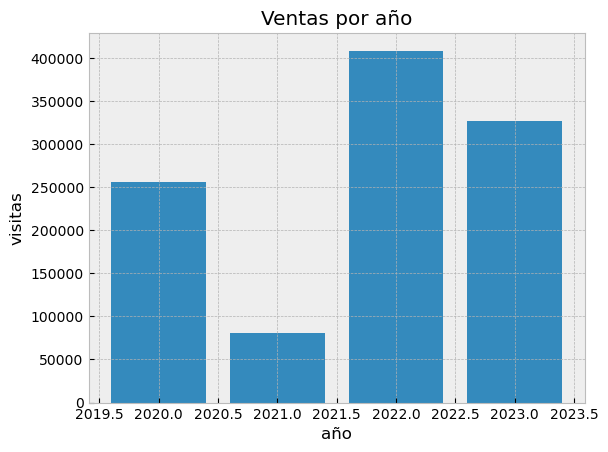

In [28]:
#Este grafico me mostrara las VISITAS por año

plt.bar(VIEWSbyyear.index,VIEWSbyyear['Total Page Views'])
plt.title('Ventas por año')
ax6 = plt.subplot()  # Axis
ax6.set_xlabel('año')
ax6.set_ylabel('visitas')

In [29]:
Visitas_acum = df[['Total Page Views']].sum()
Ventas_acum = df[["Total Sales (units)"]].sum()
Visitas_acum


Total Page Views    1072333
dtype: int64

Text(0, 0.5, 'ventas')

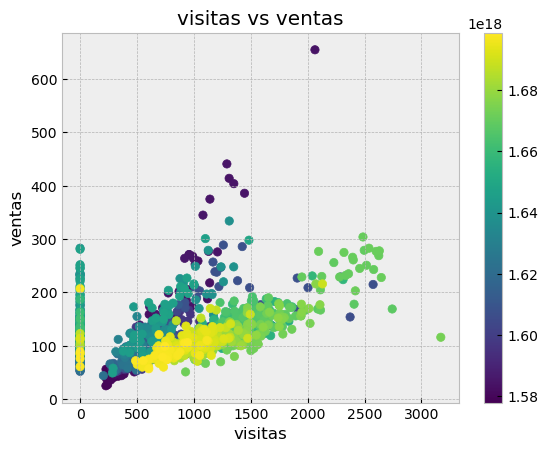

In [30]:
#Este grafico me mostrara la correlacion entre VISITAS Y VENTAS DIARIAS

fig, ax4 = plt.subplots() #crea un objeto figura y un objeto ax
mapeo_cruzado = ax4.scatter(df["Total Page Views"], df["Total Sales (units)"], c=df.index) #el objeto ax es el que va a tener la funcion scatter
fig.colorbar(mapeo_cruzado) # agrego el colorbar
ax4.set_title('visitas vs ventas') #agrego el titulo
ax4.set_xlabel('visitas') #agrego el eje x
ax4.set_ylabel('ventas') #agrego el eje y

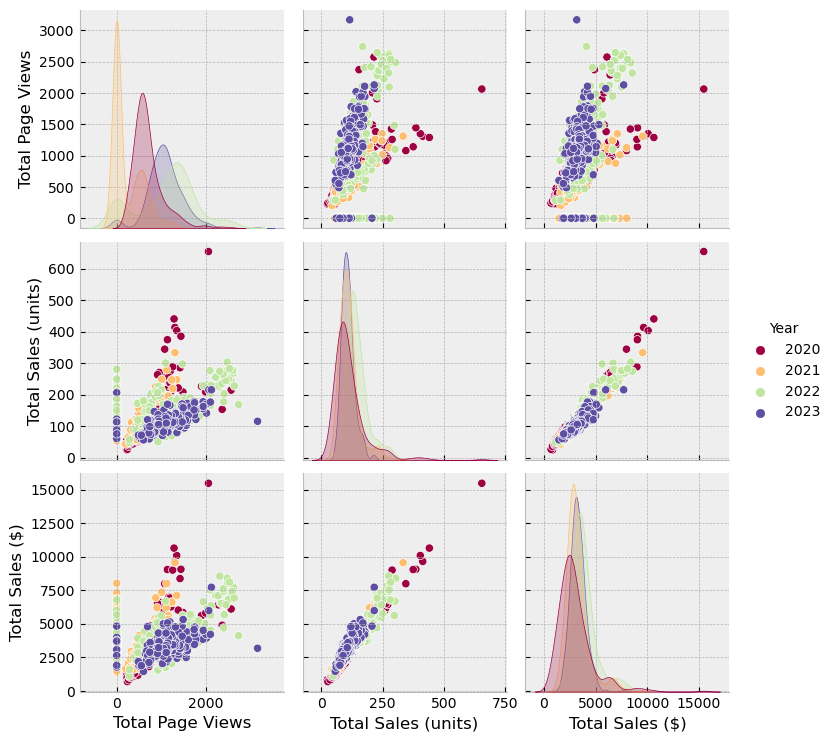

In [31]:
#Aqui uso seaborn para comparar las VISITAS, VENTAS en unidades, VENTAS en MONTO


nuevo = df[["Year","Total Page Views","Total Sales (units)","Total Sales ($)"]]
g = sns.pairplot(nuevo, hue="Year", palette="Spectral")


Podemos observar que existe una relacion lineal entre las 'Page Views' y 'Total SALES', pero tambien se observa que en los años anteriores la relacion era màs fuerte, y se fue aplanando la curva hacia 2023. Podriamos decir que a primera vista la correlacion tiende a desaparcer con los años. 

In [32]:
Months = df.Month.unique()
Months

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12], dtype=int64)

In [33]:
VIEWSbymonth = pd.DataFrame( df.groupby(['Month'])[['Total Page Views']].sum() , index= Months)
VIEWSbymonth

,Total Page Views
1,88525
2,78417
3,86764
4,79381
5,81586
6,87220
7,98705
8,92620
9,85444
10,85545


In [34]:
SALESbymonth = pd.DataFrame( df.groupby(['Month'])[["Total Sales (units)"]].sum() , index= Months)
SALESbymonth

,Total Sales (units)
1,13017
2,13207
3,19277
4,12715
5,11770
6,12300
7,14836
8,15202
9,12813
10,13077


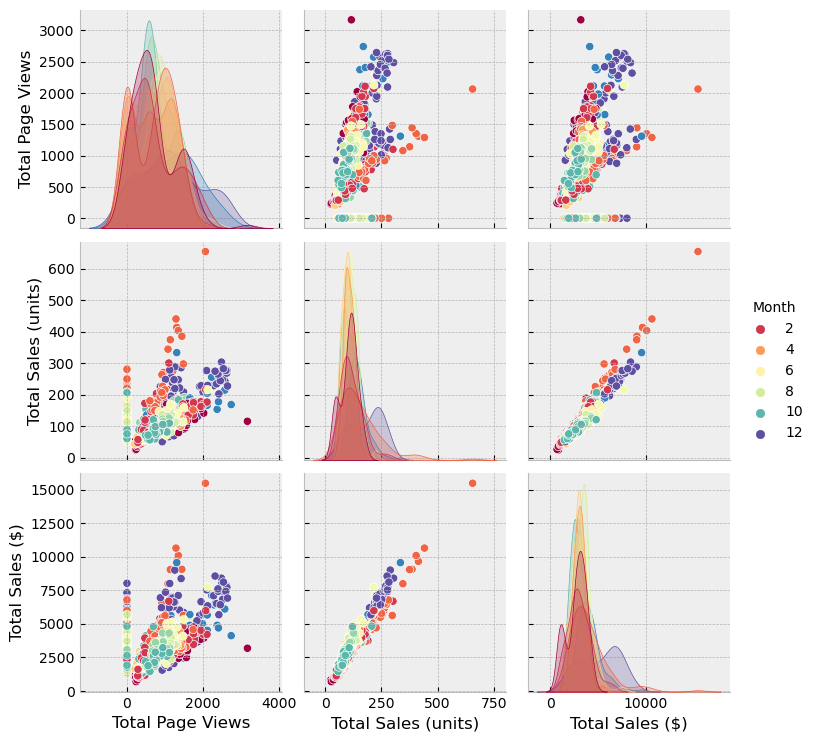

In [35]:
df3 = df[["Month","Total Page Views","Total Sales (units)","Total Sales ($)"]]
g = sns.pairplot(df3, hue="Month", palette="Spectral")

En esta agrupación por meses del año, podemos observar que existe una relacion lineal entre las 'Page Views' y 'Total SALES'.
Se visualiza un cierto nivel de óutliers en los valores correspondientes a MARZO.

D:\New folder\New folder\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
D:\New folder\New folder\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
D:\New folder\New folder\Lib\site-packages\seaborn\axisgrid.py:1507: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=vector, **plot_kwargs)
D:\New folder\New folder\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
D:\New folder\New folder\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(x=x, y=y, **kwargs)
D:\New folder\New folder\Lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: Ignoring `palette` because no `hue` va

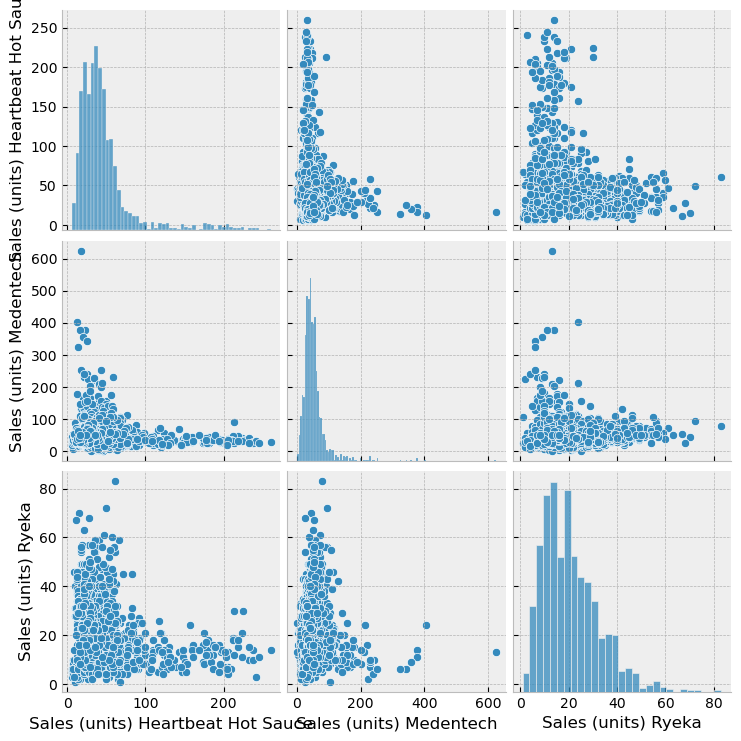

In [36]:
df31 = df[['Sales (units) Heartbeat Hot Sauce','Sales (units) Medentech',"Sales (units) Ryeka"]]
g = sns.pairplot(df31, palette="Spectral")

DE LA COMPARACION DE LAS VENTAS DE LAS 3 MARCAS, OBSERVAMOS QUE NO EXISTE UNA CORRELACION ENTRE LAS MISMAS, PODEMOS AFIRMAR QUE LAS VENTAS SON TOTALMENTE INDEPENDIENTES UNAS DE OTRAS

In [37]:
ViewsSALESbymonth = pd.concat([SALESbymonth , VIEWSbymonth.reindex(SALESbymonth.index)], axis=1)
ViewsSALESbymonth

,Total Sales (units),Total Page Views
1,13017,88525
2,13207,78417
3,19277,86764
4,12715,79381
5,11770,81586
6,12300,87220
7,14836,98705
8,15202,92620
9,12813,85444
10,13077,85545


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


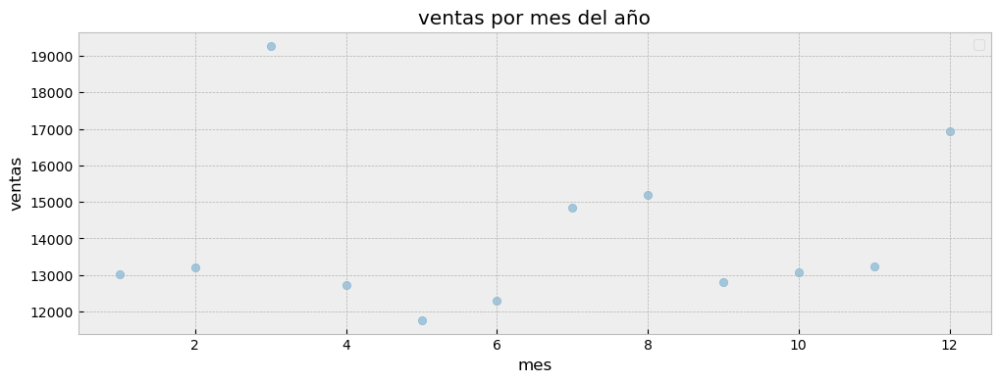

In [38]:
fig, ax4 = plt.subplots(figsize=(12, 4)) # crea un objeto figura y un objeto ax
ax4.scatter(ViewsSALESbymonth.index,ViewsSALESbymonth['Total Sales (units)'], alpha=0.4) # grafica los datos de alturas y pesos con grafico del tipo scatter
ax4.set_xlabel('mes') #es el nombre del eje x
ax4.set_ylabel('ventas') # es el nombre del eje y
ax4.set_title('ventas por mes del año') #es el titulo de la figura
ax4.legend() 

En el gráfico anterior se puede visualizar el comportamiento "atipico" del mes de marzo Y DICIEMBRE dentro de la evolucion de ventas durante los meses del año.
Serìa importante identificar las causas de dicho comportamiento para saber si se trata de un patrón de ventas o una causa externa que afecta a las variables en estudio.

# DATA WRANGLING
comenzamos a modelar los datos para intentar encontrat la version final que luego voy a automatizar a partir del datalake

In [40]:
df4 = DFdatosrel
df4.head()

,Year,Month,Total Sales,Sales HB,Sales MED,Sales RYE,Total Page Views,Page Views HB,Page Views MED,Page Views RYE,avg Max Temp,Daylight hs
0,2020,1,1610,338,1074,198.0,9778,3027,6062,689.0,1.780645,9.336452
1,2020,2,2739,553,1888,298.0,16325,5181,9687,1457.0,0.537931,10.490690
2,2020,3,7600,712,6534,354.0,29911,6162,22340,1409.0,7.293548,11.950645
3,2020,4,3015,1025,1554,436.0,17906,9340,6980,1586.0,10.716667,13.457000
4,2020,5,2387,850,956,581.0,15561,8035,4788,2738.0,17.293548,14.741290


In [41]:
df4.describe()

,Year,Month,Total Sales,Sales HB,Sales MED,Sales RYE,Total Page Views,Page Views HB,Page Views MED,Page Views RYE,avg Max Temp,Daylight hs
count,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000
mean,2021.434783,6.282609,3660.413043,1436.673913,1593.173913,630.565217,23311.586957,10866.152174,8871.195652,3574.239130,14.585887,12.335890
std,1.108596,3.397143,1124.645457,971.102056,964.468012,265.783927,14933.841079,9855.379454,6014.693803,3326.559365,10.206379,2.197442
min,2020.000000,1.000000,1610.000000,338.000000,376.000000,198.000000,1530.000000,1056.000000,182.000000,292.000000,-3.212903,8.987419
25%,2020.250000,3.250000,2873.500000,875.250000,1112.750000,417.750000,11774.750000,5260.000000,4054.500000,825.500000,4.978226,10.489905
50%,2021.000000,6.000000,3497.000000,1281.000000,1465.000000,584.000000,21420.000000,8156.000000,9335.000000,2169.000000,14.645996,12.497000
75%,2022.000000,9.000000,4176.000000,1435.500000,1871.250000,753.250000,33797.750000,13632.000000,12993.500000,6065.500000,24.075000,14.531774
max,2023.000000,12.000000,7600.000000,4736.000000,6534.000000,1237.000000,61935.000000,49663.000000,22340.000000,10937.000000,30.351613,15.398000


# Buscaremos valores atipicos en las ventas diarias

BUSCO DATOS ATIPICOS UTILIZANDO EL METODO DEL Z SCORE

In [42]:
df4_z=pd.DataFrame()
for j in df4.columns[2:]:
  df4_z[j] = (df4[j] - df4[j].mean()) / df4[j].std()
df4_z.head()

,Total Sales,Sales HB,Sales MED,Sales RYE,Total Page Views,Page Views HB,Page Views MED,Page Views RYE,avg Max Temp,Daylight hs
0,-1.823164,-1.131368,-0.538301,-1.627507,-0.906236,-0.795419,-0.467055,-0.867334,-1.254631,-1.364968
1,-0.819292,-0.909970,0.305688,-1.251262,-0.467836,-0.576858,0.135635,-0.636465,-1.376390,-0.839704
2,3.502959,-0.746239,5.122851,-1.040564,0.441910,-0.477318,2.239317,-0.650894,-0.714488,-0.175315
3,-0.573881,-0.423924,-0.040617,-0.732043,-0.361969,-0.154855,-0.314429,-0.597686,-0.379098,0.510189
4,-1.132280,-0.604132,-0.660648,-0.186487,-0.518995,-0.287270,-0.678870,-0.251383,0.265291,1.094637


In [43]:
df4_z.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46 entries, 0 to 45
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Total Sales       46 non-null     float64
 1   Sales HB          46 non-null     float64
 2   Sales MED         46 non-null     float64
 3   Sales RYE         46 non-null     float64
 4   Total Page Views  46 non-null     float64
 5   Page Views HB     46 non-null     float64
 6   Page Views MED    46 non-null     float64
 7   Page Views RYE    46 non-null     float64
 8   avg Max Temp      46 non-null     float64
 9   Daylight hs       46 non-null     float64
dtypes: float64(10)
memory usage: 3.7 KB


In [44]:
df4_z['Total Sales_x']= df4_z['Total Sales'].apply(lambda x: 'Atipico' if (x>2 or x<-2) else 'Normal')
df4_z.head()

,Total Sales,Sales HB,Sales MED,Sales RYE,Total Page Views,Page Views HB,Page Views MED,Page Views RYE,avg Max Temp,Daylight hs,Total Sales_x
0,-1.823164,-1.131368,-0.538301,-1.627507,-0.906236,-0.795419,-0.467055,-0.867334,-1.254631,-1.364968,Normal
1,-0.819292,-0.909970,0.305688,-1.251262,-0.467836,-0.576858,0.135635,-0.636465,-1.376390,-0.839704,Normal
2,3.502959,-0.746239,5.122851,-1.040564,0.441910,-0.477318,2.239317,-0.650894,-0.714488,-0.175315,Atipico
3,-0.573881,-0.423924,-0.040617,-0.732043,-0.361969,-0.154855,-0.314429,-0.597686,-0.379098,0.510189,Normal
4,-1.132280,-0.604132,-0.660648,-0.186487,-0.518995,-0.287270,-0.678870,-0.251383,0.265291,1.094637,Normal


<Axes: ylabel='Total Sales'>

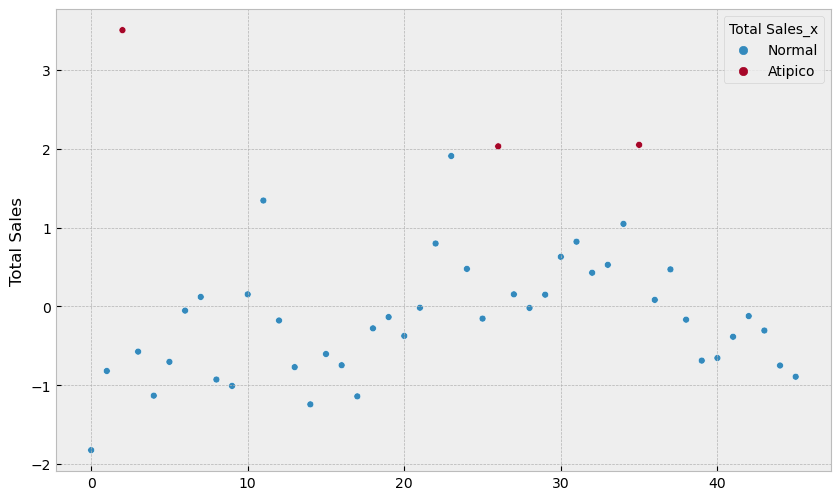

In [45]:
plt.figure(figsize=(10,6))
sns.scatterplot(x=df4_z.index, y= df4_z['Total Sales'], hue= df4_z['Total Sales_x'],s= 25)

Aqui podemos observar que existe una cierta correlacion visual entre los meses ¨calidos¨ para el hemisferio norte Junio-Sept, pero tambien vemos que tanto en Marzo-Abril de 2020 como en Febrero-Marzo de 2022 se produjeron ventas extraordinarias por fuera de lo normal


In [46]:
df4_z['avg Max Temp_x']= df4_z['avg Max Temp'].apply(lambda x: 'Atipico' if (x>2 or x<-2) else 'Normal')
df4_z.head()

,Total Sales,Sales HB,Sales MED,Sales RYE,Total Page Views,Page Views HB,Page Views MED,Page Views RYE,avg Max Temp,Daylight hs,Total Sales_x,avg Max Temp_x
0,-1.823164,-1.131368,-0.538301,-1.627507,-0.906236,-0.795419,-0.467055,-0.867334,-1.254631,-1.364968,Normal,Normal
1,-0.819292,-0.909970,0.305688,-1.251262,-0.467836,-0.576858,0.135635,-0.636465,-1.376390,-0.839704,Normal,Normal
2,3.502959,-0.746239,5.122851,-1.040564,0.441910,-0.477318,2.239317,-0.650894,-0.714488,-0.175315,Atipico,Normal
3,-0.573881,-0.423924,-0.040617,-0.732043,-0.361969,-0.154855,-0.314429,-0.597686,-0.379098,0.510189,Normal,Normal
4,-1.132280,-0.604132,-0.660648,-0.186487,-0.518995,-0.287270,-0.678870,-0.251383,0.265291,1.094637,Normal,Normal


<Axes: ylabel='avg Max Temp'>

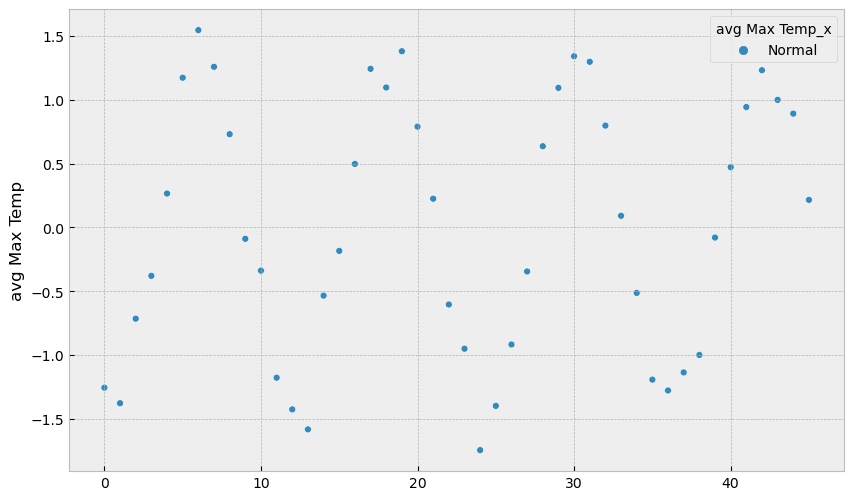

In [47]:
plt.figure(figsize=(10,6))
sns.scatterplot(x=df4_z.index, y= df4_z['avg Max Temp'], hue= df4_z['avg Max Temp_x'],s= 25)

<Axes: ylabel='Sales HB'>

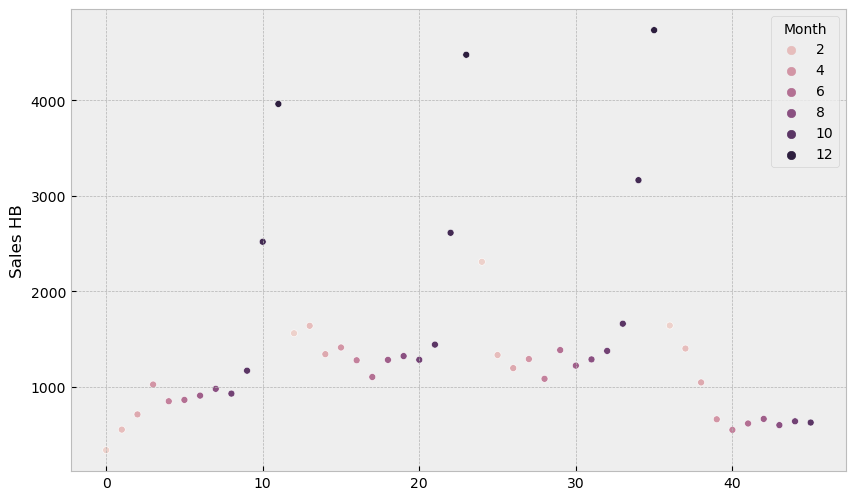

In [48]:
plt.figure(figsize=(10,6))
sns.scatterplot(x=df4.index, y= df4['Sales HB'], hue= df4['Month'],s= 25)

# CONCLUSIONES PRELIMINARES


De acuerdo a los datos analizados hasta el momento, se puede afirmar que existió un patrón de ventas fuera de lo normal durante los meses de MArzo y Abril en el año 2020 coincidente con el comienzo de la pandemia global. Asi como tambien se puede aislar un fenómeno similar an Febrero y Marzo del 2022 con el inicio de la guerra en UCRANIA. Esta correlacion temporal es una de las hipotesis solicitada por la empresa para ser evaluada, ya que en su mix de productos tienen sistemas de purificacion de agua potable que ellos consideran que las ventas de estos podrían estar fuertemente afectadas por fenomenos globales de esta naturaleza, asi como fenomentos del tipo catástrofe natural.
eN CUANTO A LAS 3 LINEAS DE PRODUCTOS, SUS DEMANDAS SON INDEPENDIENTES ENTRE SI, Y HAY CIERTA CORRELACION POSITIVA EN LAS VENTAS HACIA EL PERIODO FESTIVO DE DICIEMBRE

# CONTINUANDO CON EL ANALISIS

Se agregaron las ventas de productos de 3 marcas distintas, para poder evauluar realizar analisis por mes, año, marca.
nos interesa analizar la correlatividad entre Page views y ventas.

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy
import matplotlib as mpl



In [50]:
df4_z.info()
df4_z.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46 entries, 0 to 45
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Total Sales       46 non-null     float64
 1   Sales HB          46 non-null     float64
 2   Sales MED         46 non-null     float64
 3   Sales RYE         46 non-null     float64
 4   Total Page Views  46 non-null     float64
 5   Page Views HB     46 non-null     float64
 6   Page Views MED    46 non-null     float64
 7   Page Views RYE    46 non-null     float64
 8   avg Max Temp      46 non-null     float64
 9   Daylight hs       46 non-null     float64
 10  Total Sales_x     46 non-null     object 
 11  avg Max Temp_x    46 non-null     object 
dtypes: float64(10), object(2)
memory usage: 4.4+ KB


,Total Sales,Sales HB,Sales MED,Sales RYE,Total Page Views,Page Views HB,Page Views MED,Page Views RYE,avg Max Temp,Daylight hs,Total Sales_x,avg Max Temp_x
0,-1.823164,-1.131368,-0.538301,-1.627507,-0.906236,-0.795419,-0.467055,-0.867334,-1.254631,-1.364968,Normal,Normal
1,-0.819292,-0.909970,0.305688,-1.251262,-0.467836,-0.576858,0.135635,-0.636465,-1.376390,-0.839704,Normal,Normal
2,3.502959,-0.746239,5.122851,-1.040564,0.441910,-0.477318,2.239317,-0.650894,-0.714488,-0.175315,Atipico,Normal
3,-0.573881,-0.423924,-0.040617,-0.732043,-0.361969,-0.154855,-0.314429,-0.597686,-0.379098,0.510189,Normal,Normal
4,-1.132280,-0.604132,-0.660648,-0.186487,-0.518995,-0.287270,-0.678870,-0.251383,0.265291,1.094637,Normal,Normal


In [51]:
df4.info()
df4.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46 entries, 0 to 45
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Year              46 non-null     int64  
 1   Month             46 non-null     int64  
 2   Total Sales       46 non-null     int64  
 3   Sales HB          46 non-null     int64  
 4   Sales MED         46 non-null     int64  
 5   Sales RYE         46 non-null     float64
 6   Total Page Views  46 non-null     int64  
 7   Page Views HB     46 non-null     int64  
 8   Page Views MED    46 non-null     int64  
 9   Page Views RYE    46 non-null     float64
 10  avg Max Temp      46 non-null     float64
 11  Daylight hs       46 non-null     float64
dtypes: float64(4), int64(8)
memory usage: 4.4 KB


,Year,Month,Total Sales,Sales HB,Sales MED,Sales RYE,Total Page Views,Page Views HB,Page Views MED,Page Views RYE,avg Max Temp,Daylight hs
count,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000
mean,2021.434783,6.282609,3660.413043,1436.673913,1593.173913,630.565217,23311.586957,10866.152174,8871.195652,3574.239130,14.585887,12.335890
std,1.108596,3.397143,1124.645457,971.102056,964.468012,265.783927,14933.841079,9855.379454,6014.693803,3326.559365,10.206379,2.197442
min,2020.000000,1.000000,1610.000000,338.000000,376.000000,198.000000,1530.000000,1056.000000,182.000000,292.000000,-3.212903,8.987419
25%,2020.250000,3.250000,2873.500000,875.250000,1112.750000,417.750000,11774.750000,5260.000000,4054.500000,825.500000,4.978226,10.489905
50%,2021.000000,6.000000,3497.000000,1281.000000,1465.000000,584.000000,21420.000000,8156.000000,9335.000000,2169.000000,14.645996,12.497000
75%,2022.000000,9.000000,4176.000000,1435.500000,1871.250000,753.250000,33797.750000,13632.000000,12993.500000,6065.500000,24.075000,14.531774
max,2023.000000,12.000000,7600.000000,4736.000000,6534.000000,1237.000000,61935.000000,49663.000000,22340.000000,10937.000000,30.351613,15.398000


In [52]:
import pandas                  as pd
from   scipy import stats
import numpy                   as np
import matplotlib.pyplot       as plt
import seaborn                 as sns
import statsmodels.formula.api as sm
import chart_studio.plotly     as py
from bokeh.resources import INLINE
import bokeh.io
from bokeh import *
import pingouin
bokeh.io.output_notebook(INLINE)

Loading BokehJS ...

In [53]:
df4.shape

(46, 12)

In [54]:
df4.head()

,Year,Month,Total Sales,Sales HB,Sales MED,Sales RYE,Total Page Views,Page Views HB,Page Views MED,Page Views RYE,avg Max Temp,Daylight hs
0,2020,1,1610,338,1074,198.0,9778,3027,6062,689.0,1.780645,9.336452
1,2020,2,2739,553,1888,298.0,16325,5181,9687,1457.0,0.537931,10.490690
2,2020,3,7600,712,6534,354.0,29911,6162,22340,1409.0,7.293548,11.950645
3,2020,4,3015,1025,1554,436.0,17906,9340,6980,1586.0,10.716667,13.457000
4,2020,5,2387,850,956,581.0,15561,8035,4788,2738.0,17.293548,14.741290


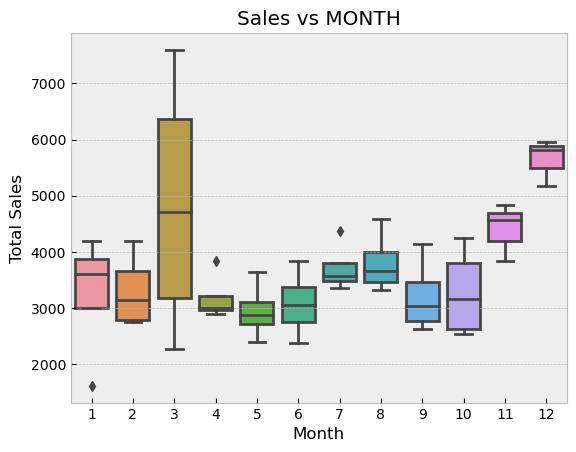

In [55]:
sns.boxplot(x='Month', y = 'Total Sales', data = df4) 
#Data.boxplot(grid= False, column = ['sales'], by = ['supplier'])
plt.title("Sales vs MONTH");

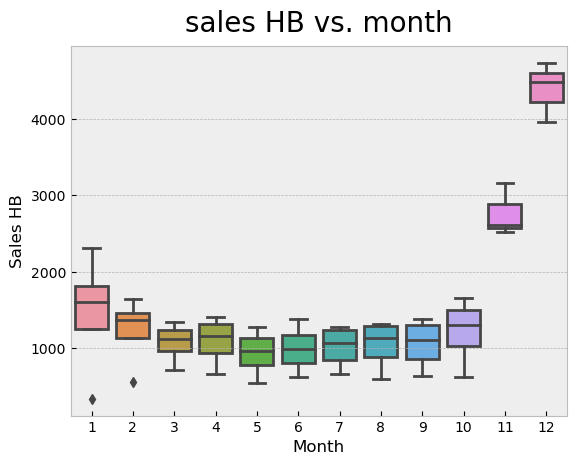

In [56]:
sns.boxplot(x='Month', y = 'Sales HB', data = df4) 
plt.title("sales HB vs. month", fontsize=20, verticalalignment='bottom');

In [57]:
ESTA MARCA TIENE UNA FUERTE ASIMETRIA DE VENTAS EN EL PERIODO DE LAS FIESTA DE FIN DE AÑO

SyntaxError: invalid syntax (1815041727.py, line 1)

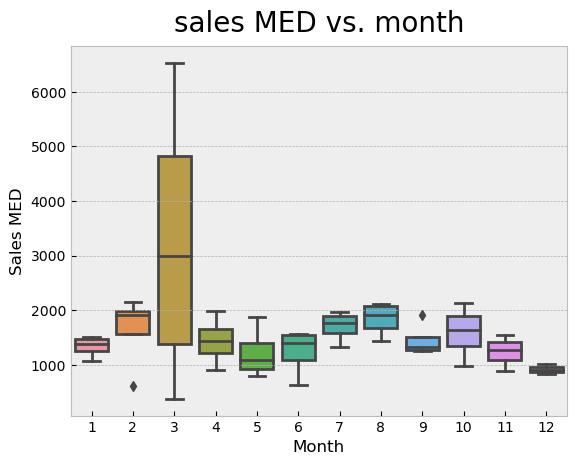

In [58]:
sns.boxplot(x='Month', y = 'Sales MED', data = df4) 
plt.title("sales MED vs. month", fontsize=20, verticalalignment='bottom');

aQUI SE PUEDE OBSERVAR CLARAMENTE LO PLANTEADO ANTERIORMENTE RESPECTO A LA ANOMALIA DE LAS VENTAS OBSERVABLE EN EL MES DE MARZO PARA ESTA MARCA RELACIONADA CON LA PURIFICACION DE AGUA PARA CONSUMO HUMANO

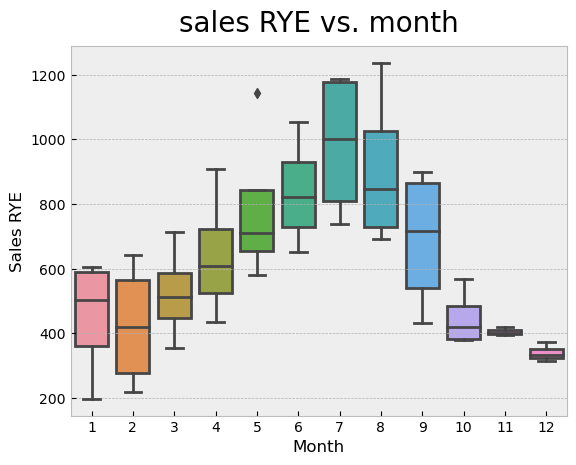

In [59]:
sns.boxplot(x='Month', y = 'Sales RYE', data = df4) 
plt.title("sales RYE vs. month", fontsize=20, verticalalignment='bottom');

ESTA MARCA TIENE ESTACIONALIDAD DE VENTAS COMPATIBLE CON EL VERANO EN EL HEMISFERIO NORTE

In [60]:
df4.columns

Index(['Year', 'Month', 'Total Sales', 'Sales HB', 'Sales MED', 'Sales RYE',
       'Total Page Views', 'Page Views HB', 'Page Views MED', 'Page Views RYE',
       'avg Max Temp', 'Daylight hs'],
      dtype='object')

In [61]:
model2 = 'Sales RYE~Page Views RYE + avg Max Temp''
lm2    = sm.ols(formula = model2, data = df4).fit()
print(lm2.summary())

SyntaxError: unterminated string literal (detected at line 1) (768023812.py, line 1)

# ANALISIS DEL OLS SCORE ENTRE LAS DIFERENTES VARIABLES

In [62]:
import pandas as pd                         # Este proporciona una estructura similiar a los data.frame
import statsmodels.api as sm                # Este proporciona funciones para la estimación de muchos modelos estadísticos
import statsmodels.formula.api as smf       # Permite ajustar modelos estadísticos utilizando fórmulas de estilo R
import matplotlib.pyplot as plt             # Permite la generación de gráficos

In [63]:
import statsmodels.formula.api as smf

# Definir la fórmula del modelo de regresión con Q()
model_formula = 'Q("Total Page Views") ~ Q("Total Sales")'

# Crear y ajustar el modelo de regresión
lm = smf.ols(formula=model_formula, data=df4).fit()

# Imprimir el resumen del modelo
print("OLS PARA PAGE VIEWS TOTALES VS VENTAS TOTALES")
print(lm.summary())


OLS PARA PAGE VIEWS TOTALES VS VENTAS TOTALES
                              OLS Regression Results                             
Dep. Variable:     Q("Total Page Views")   R-squared:                       0.202
Model:                               OLS   Adj. R-squared:                  0.183
Method:                    Least Squares   F-statistic:                     11.11
Date:                   Wed, 06 Dec 2023   Prob (F-statistic):            0.00175
Time:                           13:49:00   Log-Likelihood:                -501.71
No. Observations:                     46   AIC:                             1007.
Df Residuals:                         44   BIC:                             1011.
Df Model:                              1                                         
Covariance Type:               nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------

In [64]:
# Definir la fórmula del modelo de regresión con Q()
#Index(['Year', 'Month', 'Total Sales', 'Sales HB', 'Sales MED', 'Sales RYE', 'Total Page Views', 'Page Views HB', 'Page Views MED', 'Page Views RYE','avg Max Temp', 'Daylight hs'],
#pOR TIPO DE VENTA
model_formula = 'Q("avg Max Temp") ~ Q("Total Sales")'

# Crear y ajustar el modelo de regresión
lm = smf.ols(formula=model_formula, data=df4).fit()

# Imprimir el resumen del modelo
print("OLS PARA TEMPERATURAS PROM VS VENTAS TOTALES")
print(lm.summary())

OLS PARA TEMPERATURAS PROM VS VENTAS TOTALES
                            OLS Regression Results                            
Dep. Variable:      Q("avg Max Temp")   R-squared:                       0.052
Model:                            OLS   Adj. R-squared:                  0.030
Method:                 Least Squares   F-statistic:                     2.400
Date:                Wed, 06 Dec 2023   Prob (F-statistic):              0.129
Time:                        13:49:00   Log-Likelihood:                -170.40
No. Observations:                  46   AIC:                             344.8
Df Residuals:                      44   BIC:                             348.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------

In [65]:
# Definir la fórmula del modelo de regresión con Q()
#Index(['Year', 'Month', 'Total Sales', 'Sales HB', 'Sales MED', 'Sales RYE', 'Total Page Views', 'Page Views HB', 'Page Views MED', 'Page Views RYE','avg Max Temp', 'Daylight hs'],
#pOR TIPO DE VENTA
model_formula = 'Q("avg Max Temp") ~ Q("Sales HB")'

# Crear y ajustar el modelo de regresión
lm = smf.ols(formula=model_formula, data=df4).fit()

# Imprimir el resumen del modelo
print("OLS PARA TEMPERATURAS PROM VS VENTAS HB")
print(lm.summary())

OLS PARA TEMPERATURAS PROM VS VENTAS HB
                            OLS Regression Results                            
Dep. Variable:      Q("avg Max Temp")   R-squared:                       0.169
Model:                            OLS   Adj. R-squared:                  0.150
Method:                 Least Squares   F-statistic:                     8.943
Date:                Wed, 06 Dec 2023   Prob (F-statistic):            0.00455
Time:                        13:49:01   Log-Likelihood:                -167.37
No. Observations:                  46   AIC:                             338.7
Df Residuals:                      44   BIC:                             342.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Interc

In [66]:
# Definir la fórmula del modelo de regresión con Q()
#Index(['Year', 'Month', 'Total Sales', 'Sales HB', 'Sales MED', 'Sales RYE', 'Total Page Views', 'Page Views HB', 'Page Views MED', 'Page Views RYE','avg Max Temp', 'Daylight hs'],
#pOR TIPO DE VENTA
model_formula = 'Q("avg Max Temp") ~ Q("Sales MED")'

# Crear y ajustar el modelo de regresión
lm = smf.ols(formula=model_formula, data=df4).fit()

# Imprimir el resumen del modelo
print("OLS PARA TEMPERATURAS PROM VS VENTAS MED")
print(lm.summary())

OLS PARA TEMPERATURAS PROM VS VENTAS MED
                            OLS Regression Results                            
Dep. Variable:      Q("avg Max Temp")   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.021
Method:                 Least Squares   F-statistic:                   0.08490
Date:                Wed, 06 Dec 2023   Prob (F-statistic):              0.772
Time:                        13:49:02   Log-Likelihood:                -171.58
No. Observations:                  46   AIC:                             347.2
Df Residuals:                      44   BIC:                             350.8
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Int

In [67]:
# Definir la fórmula del modelo de regresión con Q()
#Index(['Year', 'Month', 'Total Sales', 'Sales HB', 'Sales MED', 'Sales RYE', 'Total Page Views', 'Page Views HB', 'Page Views MED', 'Page Views RYE','avg Max Temp', 'Daylight hs'],
#pOR TIPO DE VENTA
model_formula = 'Q("avg Max Temp") ~ Q("Sales RYE")'

# Crear y ajustar el modelo de regresión
lm = smf.ols(formula=model_formula, data=df4).fit()

# Imprimir el resumen del modelo
print("OLS PARA TEMPERATURAS PROM VS VENTAS RYE")
print(lm.summary())

OLS PARA TEMPERATURAS PROM VS VENTAS RYE
                            OLS Regression Results                            
Dep. Variable:      Q("avg Max Temp")   R-squared:                       0.488
Model:                            OLS   Adj. R-squared:                  0.476
Method:                 Least Squares   F-statistic:                     41.93
Date:                Wed, 06 Dec 2023   Prob (F-statistic):           6.74e-08
Time:                        13:49:02   Log-Likelihood:                -156.23
No. Observations:                  46   AIC:                             316.5
Df Residuals:                      44   BIC:                             320.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Int

In [68]:
# Definir la fórmula del modelo de regresión con Q()
#Index(['Year', 'Month', 'Total Sales', 'Sales HB', 'Sales MED', 'Sales RYE', 'Total Page Views', 'Page Views HB', 'Page Views MED', 'Page Views RYE','avg Max Temp', 'Daylight hs'],
#pOR TIPO DE VENTA
model_formula = 'Q("Daylight hs") ~ Q("Total Sales")'

# Crear y ajustar el modelo de regresión
lm = smf.ols(formula=model_formula, data=df4).fit()

# Imprimir el resumen del modelo
print("OLS PARA HORAS DIARIAS DE LUZ VS VENTAS TOTALES")
print(lm.summary())

OLS PARA HORAS DIARIAS DE LUZ VS VENTAS TOTALES
                            OLS Regression Results                            
Dep. Variable:       Q("Daylight hs")   R-squared:                       0.089
Model:                            OLS   Adj. R-squared:                  0.068
Method:                 Least Squares   F-statistic:                     4.282
Date:                Wed, 06 Dec 2023   Prob (F-statistic):             0.0444
Time:                        13:49:03   Log-Likelihood:                -98.845
No. Observations:                  46   AIC:                             201.7
Df Residuals:                      44   BIC:                             205.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------

In [69]:
# Definir la fórmula del modelo de regresión con Q()
#Index(['Year', 'Month', 'Total Sales', 'Sales HB', 'Sales MED', 'Sales RYE', 'Total Page Views', 'Page Views HB', 'Page Views MED', 'Page Views RYE','avg Max Temp', 'Daylight hs'],
#pOR TIPO DE VENTA
model_formula = 'Q("Daylight hs") ~ Q("Sales RYE")'

# Crear y ajustar el modelo de regresión
lm = smf.ols(formula=model_formula, data=df4).fit()

# Imprimir el resumen del modelo
print("OLS PARA HORAS DIARIAS DE LUZ VS VENTAS RYE")
print(lm.summary())

OLS PARA HORAS DIARIAS DE LUZ VS VENTAS RYE
                            OLS Regression Results                            
Dep. Variable:       Q("Daylight hs")   R-squared:                       0.536
Model:                            OLS   Adj. R-squared:                  0.526
Method:                 Least Squares   F-statistic:                     50.91
Date:                Wed, 06 Dec 2023   Prob (F-statistic):           7.24e-09
Time:                        13:49:04   Log-Likelihood:                -83.299
No. Observations:                  46   AIC:                             170.6
Df Residuals:                      44   BIC:                             174.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------


In [70]:
# Definir la fórmula del modelo de regresión con Q()
#Index(['Year', 'Month', 'Total Sales', 'Sales HB', 'Sales MED', 'Sales RYE', 'Total Page Views', 'Page Views HB', 'Page Views MED', 'Page Views RYE','avg Max Temp', 'Daylight hs'],
#pOR TIPO DE VENTA
model_formula = 'Q("Daylight hs") ~ Q("Sales HB")'

# Crear y ajustar el modelo de regresión
lm = smf.ols(formula=model_formula, data=df4).fit()

# Imprimir el resumen del modelo
print("OLS PARA HORAS DIARIAS DE LUZ VS VENTAS HB")
print(lm.summary())

OLS PARA HORAS DIARIAS DE LUZ VS VENTAS HB
                            OLS Regression Results                            
Dep. Variable:       Q("Daylight hs")   R-squared:                       0.344
Model:                            OLS   Adj. R-squared:                  0.329
Method:                 Least Squares   F-statistic:                     23.05
Date:                Wed, 06 Dec 2023   Prob (F-statistic):           1.86e-05
Time:                        13:49:04   Log-Likelihood:                -91.294
No. Observations:                  46   AIC:                             186.6
Df Residuals:                      44   BIC:                             190.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Int

In [71]:
# Definir la fórmula del modelo de regresión con Q()
#Index(['Year', 'Month', 'Total Sales', 'Sales HB', 'Sales MED', 'Sales RYE', 'Total Page Views', 'Page Views HB', 'Page Views MED', 'Page Views RYE','avg Max Temp', 'Daylight hs'],
#pOR TIPO DE VENTA
model_formula = 'Q("Daylight hs") ~ Q("Sales MED")'

# Crear y ajustar el modelo de regresión
lm = smf.ols(formula=model_formula, data=df4).fit()

# Imprimir el resumen del modelo
print("OLS PARA HORAS DIARIAS DE LUZ VS VENTAS MED")
print(lm.summary())

OLS PARA HORAS DIARIAS DE LUZ VS VENTAS MED
                            OLS Regression Results                            
Dep. Variable:       Q("Daylight hs")   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.021
Method:                 Least Squares   F-statistic:                   0.07486
Date:                Wed, 06 Dec 2023   Prob (F-statistic):              0.786
Time:                        13:49:05   Log-Likelihood:                -100.94
No. Observations:                  46   AIC:                             205.9
Df Residuals:                      44   BIC:                             209.5
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------


#Como conclusion de esta evaluacion de correlacion, podemos afirmar que si bien las ventas totales de la combinacion de las 3 lineas de productos no se pueden correlacionar con el clima o las horas de luz. 


Cuando analizamos cada marca en particular, la linea RYEKA tiene una fuerte correlacion positiva con la temperatura, siendo su F-estadistico de 47.6%  al igual que con las horas de sol, que tiene un F-estadistico del 50.9%

# VAMOS A IMPLEMENTAR UN MODELO DE ML PARA PREDECIR LAS VENTAS DE PRODUCTOS DE LINEA RYEKA

In [72]:
import sklearn as skl
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels
from scipy import stats
from pingouin import pairwise_ttests #this is for performing the pairwise tests
from datetime import datetime, timedelta
from matplotlib import dates as mpl_dates
from mpl_toolkits.mplot3d import Axes3D
import bokeh
from bokeh.plotting import figure
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

In [73]:
dfML = dfCOPY
dfML

,Date,Sales ($) Heartbeat Hot Sauce,Sales (units) Heartbeat Hot Sauce,Avg item price ($/unit) Heartbeat Hot Sauce,Sessions Heartbeat Hot Sauce,Page Views Heartbeat Hot Sauce,Sales ($) Medentech,Sales (units) Medentech,Avg item price ($/unit) Medentech,Sessions Medentech,...,Total Page Views,max_temperature,avg_temperature,min_temperature,rain,snow,daylight,Month,Year,weekday
Date,,,,,,,,,,,,,,,,,,,,,
2020-01-01,2020-01-01,182.28,8,22.79,84,110,372.34,22,16.92,77,...,246,-0.2,-1.70,-3.2,0.0,0.0,8.98,1,2020,2
2020-01-02,2020-01-02,290.88,10,29.09,108,136,427.34,30,14.24,93,...,278,6.4,2.95,-0.5,0.0,0.0,8.98,1,2020,3
2020-01-03,2020-01-03,229.79,11,20.89,61,72,497.84,29,17.17,115,...,263,6.8,4.55,2.3,0.0,0.0,9.00,1,2020,4
2020-01-04,2020-01-04,155.92,8,19.49,64,82,433.40,29,14.94,103,...,252,2.5,0.90,-0.7,0.0,2.4,9.02,1,2020,5
2020-01-05,2020-01-05,259.76,14,18.55,58,81,624.07,39,16.00,161,...,346,1.3,-0.74,-2.8,0.0,3.6,9.05,1,2020,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-27,2023-10-27,375.42,15,25.03,143,171,805.59,41,19.65,245,...,555,23.3,20.55,17.8,0.0,0.0,10.48,10,2023,4
2023-10-28,2023-10-28,1000.03,35,28.57,292,360,933.51,49,19.05,222,...,744,18.9,12.35,5.8,0.2,0.0,10.43,10,2023,5
2023-10-29,2023-10-29,722.67,24,30.11,0,0,986.51,49,20.13,0,...,0,7.4,5.25,3.1,2.9,0.0,10.40,10,2023,6


In [74]:
dfML2=dfML[['Date','Year','Month','weekday','Total Sales (units)','Total Page Views','Sales (units) Heartbeat Hot Sauce','Page Views Heartbeat Hot Sauce','Sales (units) Medentech','Page Views Medentech','Sales (units) Ryeka','Page Views Ryeka','max_temperature','daylight']]
dfML2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1399 entries, 2020-01-01 to 2023-10-31
Data columns (total 14 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   Date                               1399 non-null   datetime64[ns]
 1   Year                               1399 non-null   int64         
 2   Month                              1399 non-null   int64         
 3   weekday                            1399 non-null   int64         
 4   Total Sales (units)                1399 non-null   int64         
 5   Total Page Views                   1399 non-null   int64         
 6   Sales (units) Heartbeat Hot Sauce  1399 non-null   int64         
 7   Page Views Heartbeat Hot Sauce     1399 non-null   int64         
 8   Sales (units) Medentech            1399 non-null   int64         
 9   Page Views Medentech               1399 non-null   int64         
 10  Sales (units) Ryek

In [75]:

dfML2=dfML2.set_axis(['Date','Year','Month','weekday','Total Sales','Total Page Views','Sales HB','Page Views HB','Sales MED','Page Views MED','Sales RYE','Page Views RYE','Max Temp','Daylight'],axis='columns',copy=False)

dfML2.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1399 entries, 2020-01-01 to 2023-10-31
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Date              1399 non-null   datetime64[ns]
 1   Year              1399 non-null   int64         
 2   Month             1399 non-null   int64         
 3   weekday           1399 non-null   int64         
 4   Total Sales       1399 non-null   int64         
 5   Total Page Views  1399 non-null   int64         
 6   Sales HB          1399 non-null   int64         
 7   Page Views HB     1399 non-null   int64         
 8   Sales MED         1399 non-null   int64         
 9   Page Views MED    1399 non-null   int64         
 10  Sales RYE         1398 non-null   float64       
 11  Page Views RYE    1398 non-null   float64       
 12  Max Temp          1399 non-null   float64       
 13  Daylight          1399 non-null   float64       
dtypes: dat

CONVIERTO MES, AÑO Y WEEKDAY EN OBJETOS

In [76]:
dfML2["weekday"] = dfML2["weekday"].astype(object, errors="raise")
dfML2["Month"] = dfML2["Month"].astype(object, errors="raise")
dfML2["Year"] = dfML2["Year"].astype(object, errors="raise")
dfML2.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1399 entries, 2020-01-01 to 2023-10-31
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Date              1399 non-null   datetime64[ns]
 1   Year              1399 non-null   object        
 2   Month             1399 non-null   object        
 3   weekday           1399 non-null   object        
 4   Total Sales       1399 non-null   int64         
 5   Total Page Views  1399 non-null   int64         
 6   Sales HB          1399 non-null   int64         
 7   Page Views HB     1399 non-null   int64         
 8   Sales MED         1399 non-null   int64         
 9   Page Views MED    1399 non-null   int64         
 10  Sales RYE         1398 non-null   float64       
 11  Page Views RYE    1398 non-null   float64       
 12  Max Temp          1399 non-null   float64       
 13  Daylight          1399 non-null   float64       
dtypes: dat

In [77]:
dfML2.shape

(1399, 14)

In [78]:
dfML2.columns

Index(['Date', 'Year', 'Month', 'weekday', 'Total Sales', 'Total Page Views',
       'Sales HB', 'Page Views HB', 'Sales MED', 'Page Views MED', 'Sales RYE',
       'Page Views RYE', 'Max Temp', 'Daylight'],
      dtype='object')

In [79]:
dfML2.describe()

,Total Sales,Total Page Views,Sales HB,Page Views HB,Sales MED,Page Views MED,Sales RYE,Page Views RYE,Max Temp,Daylight
count,1399.000000,1399.000000,1399.000000,1399.000000,1399.000000,1399.000000,1398.000000,1398.000000,1399.000000,1399.000000
mean,120.356683,766.499643,47.238742,357.285919,52.384560,291.690493,20.748212,117.607296,14.658542,12.342924
std,50.818276,586.621969,37.716530,378.344971,40.618106,240.935639,11.577672,125.593279,11.099068,2.204986
min,25.000000,0.000000,6.000000,0.000000,1.000000,0.000000,1.000000,0.000000,-13.100000,8.920000
25%,89.000000,335.500000,26.000000,118.500000,32.000000,113.000000,12.000000,18.000000,4.750000,10.300000
50%,111.000000,714.000000,38.000000,270.000000,45.000000,253.000000,18.000000,71.000000,15.100000,12.430000
75%,138.000000,1172.500000,53.000000,482.000000,59.000000,457.500000,28.000000,183.000000,24.650000,14.470000
max,655.000000,3170.000000,260.000000,2303.000000,625.000000,1859.000000,83.000000,804.000000,35.500000,15.470000


Las variables objetivo que voy a intentar predecir seran las ventas, por lo cual en el siguiente grafico visualizo las ventas en unidades de las 3 marcas y las totales combinadas.

array([<Axes: xlabel='Date'>, <Axes: xlabel='Date'>,
       <Axes: xlabel='Date'>, <Axes: xlabel='Date'>], dtype=object)

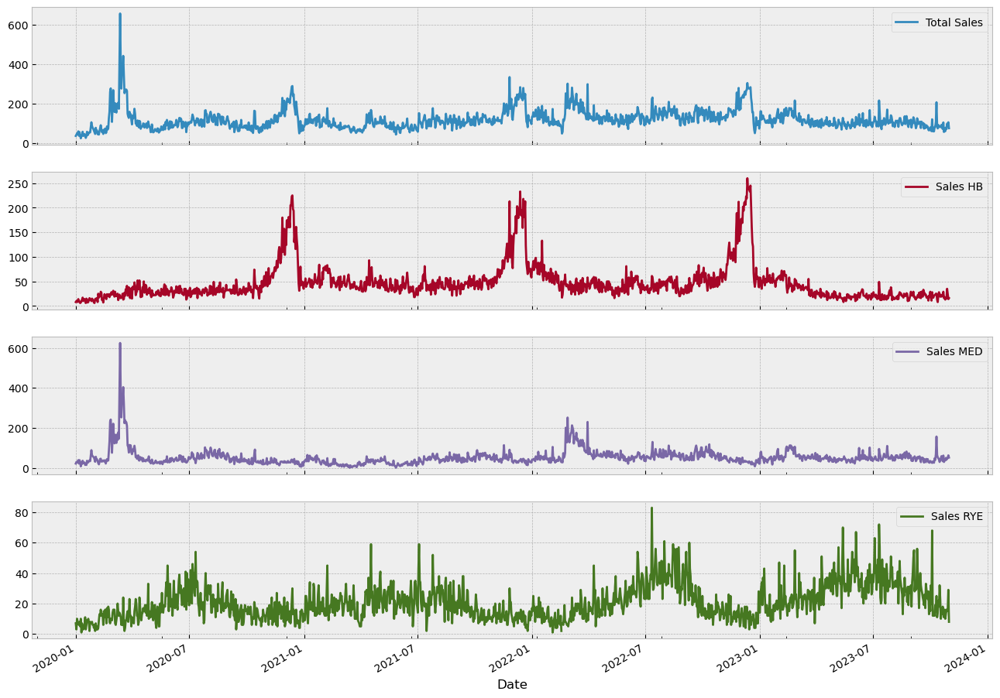

In [80]:
dfML2.plot(x='Date', y=['Total Sales','Sales HB','Sales MED','Sales RYE'], kind='line', subplots=True, figsize=(16, 12))

# filtro la marca RYE para anfocar el analisis 

In [127]:
dataRYE = dfML2[["Year","Month","weekday","Sales RYE","Page Views RYE","Daylight","Max Temp"]]
dataRYE.describe()
dataRYE.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1399 entries, 2020-01-01 to 2023-10-31
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Year            1399 non-null   object 
 1   Month           1399 non-null   object 
 2   weekday         1399 non-null   object 
 3   Sales RYE       1398 non-null   float64
 4   Page Views RYE  1398 non-null   float64
 5   Daylight        1399 non-null   float64
 6   Max Temp        1399 non-null   float64
dtypes: float64(4), object(3)
memory usage: 87.4+ KB


<Axes: ylabel='Frequency'>

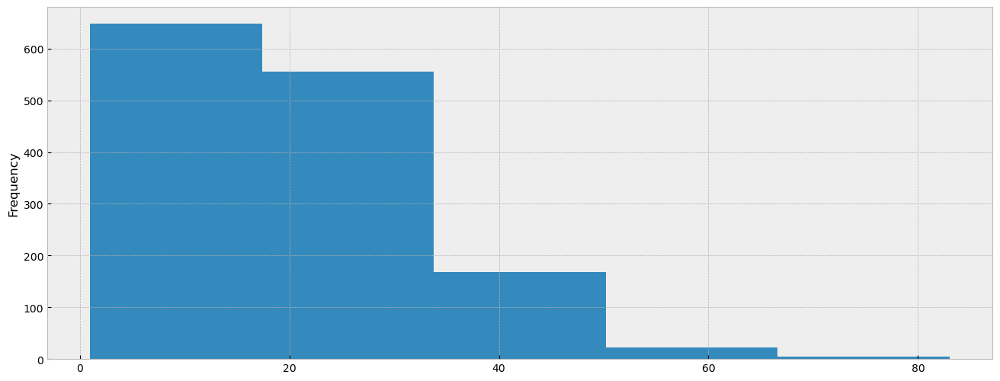

In [189]:
dataRYE['Sales RYE'].plot.hist(bins=5, figsize=(16,6))

# IMPLEMENTAREMOS UN MODELO DE ML DE REGRESION LINEAL

#RANDOM FORES REGRESSION

Los campos que agregamos para cruzar en el modelo son:

    Sales RYE  Ventas totales en unidades (variable objetivo)   
    Page Views RYE  (Clicks en la pagina, dato relacionado al gasto en publicidad)
    Daylight     horas de sol del dia en la zona      
    Max Temp     Temperatura maxima promedio diaria en la zona
     Mes

In [190]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt # Visualization 
import matplotlib.dates as mdates # Formatting dates
import seaborn as sns # Visualization
import sklearn as skl
from sklearn.preprocessing import MinMaxScaler


In [191]:
dataRYE = dataRYE.reset_index()
datosML =  pd.DataFrame(dataRYE)
datosML.info()





<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1399 entries, 0 to 1398
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   level_0         1399 non-null   int64         
 1   index           1399 non-null   int64         
 2   Date            1399 non-null   datetime64[ns]
 3   Year            1399 non-null   object        
 4   Month           1399 non-null   object        
 5   weekday         1399 non-null   object        
 6   Sales RYE       1398 non-null   float64       
 7   Page Views RYE  1398 non-null   float64       
 8   Daylight        1399 non-null   float64       
 9   Max Temp        1399 non-null   float64       
dtypes: datetime64[ns](1), float64(4), int64(2), object(3)
memory usage: 109.4+ KB


In [192]:
datosML=datosML.dropna(axis=0)
datosML.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1398 entries, 0 to 1398
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   level_0         1398 non-null   int64         
 1   index           1398 non-null   int64         
 2   Date            1398 non-null   datetime64[ns]
 3   Year            1398 non-null   object        
 4   Month           1398 non-null   object        
 5   weekday         1398 non-null   object        
 6   Sales RYE       1398 non-null   float64       
 7   Page Views RYE  1398 non-null   float64       
 8   Daylight        1398 non-null   float64       
 9   Max Temp        1398 non-null   float64       
dtypes: datetime64[ns](1), float64(4), int64(2), object(3)
memory usage: 120.1+ KB


In [193]:
datosML.isna().sum()

level_0           0
index             0
Date              0
Year              0
Month             0
weekday           0
Sales RYE         0
Page Views RYE    0
Daylight          0
Max Temp          0
dtype: int64

In [194]:
datosML =datosML.drop(['Date'],axis=1)

In [195]:
datosML.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1398 entries, 0 to 1398
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   level_0         1398 non-null   int64  
 1   index           1398 non-null   int64  
 2   Year            1398 non-null   object 
 3   Month           1398 non-null   object 
 4   weekday         1398 non-null   object 
 5   Sales RYE       1398 non-null   float64
 6   Page Views RYE  1398 non-null   float64
 7   Daylight        1398 non-null   float64
 8   Max Temp        1398 non-null   float64
dtypes: float64(4), int64(2), object(3)
memory usage: 109.2+ KB


In [196]:
datosML.describe()

,level_0,index,Sales RYE,Page Views RYE,Daylight,Max Temp
count,1398.000000,1398.000000,1398.000000,1398.000000,1398.000000,1398.000000
mean,698.942775,698.942775,20.748212,117.607296,12.344134,14.672461
std,404.139723,404.139723,11.577672,125.593279,2.205309,11.090819
min,0.000000,0.000000,1.000000,0.000000,8.920000,-13.100000
25%,349.250000,349.250000,12.000000,18.000000,10.300000,4.800000
50%,698.500000,698.500000,18.000000,71.000000,12.430000,15.100000
75%,1048.750000,1048.750000,28.000000,183.000000,14.470000,24.675000
max,1398.000000,1398.000000,83.000000,804.000000,15.470000,35.500000


In [199]:
datosML_z=pd.DataFrame()
for j in datosML.columns[3:]:
  datosML_z[j] = (datosML[j] - datosML[j].mean()) / datosML[j].std()
datosML_z.head()

,Month,weekday,Sales RYE,Page Views RYE,Daylight,Max Temp
0,-1.581307,-0.498615,-1.187476,-0.721434,-1.525471,-1.340970
1,-1.581307,0.001072,-1.532969,-0.777170,-1.525471,-0.745884
2,-1.581307,0.50076,-0.928357,-0.753283,-1.516402,-0.709818
3,-1.581307,1.000447,-1.101103,-0.713472,-1.507333,-1.097526
4,-1.581307,1.500135,-1.187476,-0.681623,-1.493729,-1.205723


Buscamos datos atipicos en las ventas

In [200]:
datosML_z['Sales RYE_x']= datosML_z['Sales RYE'].apply(lambda x: 'Atipico' if (x>2 or x<-2) else 'Normal')
datosML_z['Page Views RYE_x']= datosML_z['Page Views RYE'].apply(lambda x: 'Atipico' if (x>2 or x<-2) else 'Normal')


datosML_z.head()

,Month,weekday,Sales RYE,Page Views RYE,Daylight,Max Temp,Sales RYE_x,Page Views RYE_x
0,-1.581307,-0.498615,-1.187476,-0.721434,-1.525471,-1.340970,Normal,Normal
1,-1.581307,0.001072,-1.532969,-0.777170,-1.525471,-0.745884,Normal,Normal
2,-1.581307,0.50076,-0.928357,-0.753283,-1.516402,-0.709818,Normal,Normal
3,-1.581307,1.000447,-1.101103,-0.713472,-1.507333,-1.097526,Normal,Normal
4,-1.581307,1.500135,-1.187476,-0.681623,-1.493729,-1.205723,Normal,Normal


In [201]:
datosML_z.isna().sum()

Month               0
weekday             0
Sales RYE           0
Page Views RYE      0
Daylight            0
Max Temp            0
Sales RYE_x         0
Page Views RYE_x    0
dtype: int64

<Axes: ylabel='Sales RYE'>

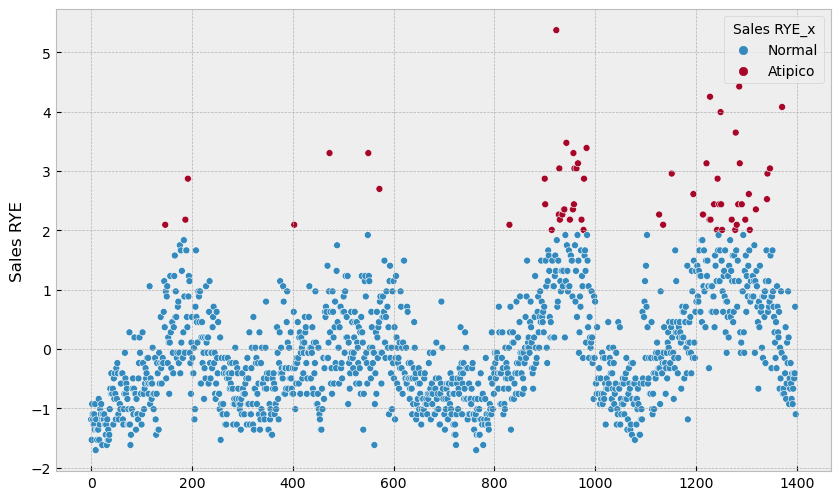

In [203]:
plt.figure(figsize=(10,6))
sns.scatterplot(x=datosML_z.index, y= datosML_z['Sales RYE'], hue= datosML_z['Sales RYE_x'],s= 25)

In [210]:
categorizacion = datosML_z[['Sales RYE_x','Page Views RYE_x']]

categorizacion 

,Sales RYE_x,Page Views RYE_x
0,Normal,Normal
1,Normal,Normal
2,Normal,Normal
3,Normal,Normal
4,Normal,Normal
...,...,...
1394,Normal,Normal
1395,Normal,Normal
1396,Normal,Normal
1397,Normal,Normal


In [221]:
datosML['Sales RYE_x']=categorizacion['Sales RYE_x']
datosML['Page Views RYE_x']=categorizacion['Page Views RYE_x']

In [222]:
datosML.head()

,level_0,index,Year,Month,weekday,Sales RYE,Page Views RYE,Daylight,Max Temp,Page Views RYE_x,Sales RYE_x
0,0,0,2020,1,2,7.0,27.0,8.98,-0.2,Normal,Normal
1,1,1,2020,1,3,3.0,20.0,8.98,6.4,Normal,Normal
2,2,2,2020,1,4,10.0,23.0,9.00,6.8,Normal,Normal
3,3,3,2020,1,5,8.0,28.0,9.02,2.5,Normal,Normal
4,4,4,2020,1,6,7.0,32.0,9.05,1.3,Normal,Normal


Voy a reemplazar los valores atipicos con la mediana

In [223]:
datosML['Sales RYE'].mean()

19.36079336718509

In [224]:
datosML.loc[datosML['Sales RYE_x']=='Atipico','Sales RYE']= datosML['Sales RYE'].mean()

In [225]:
datosML = datosML.drop(['Sales RYE_x'],axis=1)
datosML.head()

,level_0,index,Year,Month,weekday,Sales RYE,Page Views RYE,Daylight,Max Temp,Page Views RYE_x
0,0,0,2020,1,2,7.0,27.0,8.98,-0.2,Normal
1,1,1,2020,1,3,3.0,20.0,8.98,6.4,Normal
2,2,2,2020,1,4,10.0,23.0,9.00,6.8,Normal
3,3,3,2020,1,5,8.0,28.0,9.02,2.5,Normal
4,4,4,2020,1,6,7.0,32.0,9.05,1.3,Normal


In [226]:

datosML['Page Views RYE'].mean()

117.60729613733906

In [227]:
datosML.loc[datosML['Page Views RYE_x']=='Atipico','Page Views RYE']= datosML['Page Views RYE'].mean()

In [228]:
datosML = datosML.drop(['Page Views RYE_x'],axis=1)
datosML.head()

,level_0,index,Year,Month,weekday,Sales RYE,Page Views RYE,Daylight,Max Temp
0,0,0,2020,1,2,7.0,27.0,8.98,-0.2
1,1,1,2020,1,3,3.0,20.0,8.98,6.4
2,2,2,2020,1,4,10.0,23.0,9.00,6.8
3,3,3,2020,1,5,8.0,28.0,9.02,2.5
4,4,4,2020,1,6,7.0,32.0,9.05,1.3


# Genero la variable target a predecir, Sales RYE y dejo la base x con las variables independientes a utilizar 

In [229]:
X = datosML.drop(['Sales RYE', 'Year'],axis=1)
y = datosML['Sales RYE']
X.head()


,level_0,index,Month,weekday,Page Views RYE,Daylight,Max Temp
0,0,0,1,2,27.0,8.98,-0.2
1,1,1,1,3,20.0,8.98,6.4
2,2,2,1,4,23.0,9.00,6.8
3,3,3,1,5,28.0,9.02,2.5
4,4,4,1,6,32.0,9.05,1.3


In [230]:
y.head()

0     7.0
1     3.0
2    10.0
3     8.0
4     7.0
Name: Sales RYE, dtype: float64

#Convierto las variables categoricas en columnas para hacerlas numericas

In [231]:
numerical = X.drop(["Month","weekday"], axis=1)
numerical.head()

,level_0,index,Page Views RYE,Daylight,Max Temp
0,0,0,27.0,8.98,-0.2
1,1,1,20.0,8.98,6.4
2,2,2,23.0,9.00,6.8
3,3,3,28.0,9.02,2.5
4,4,4,32.0,9.05,1.3


In [232]:
categorical = X.filter(["Month"])
categorical.head()

,Month
0,1
1,1
2,1
3,1
4,1


In [233]:
cat_numerical = pd.get_dummies(categorical, drop_first= False)
cat_numerical.head()

C:\Users\borda\AppData\Local\Temp\ipykernel_752\3207952711.py:1: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  cat_numerical = pd.get_dummies(categorical, drop_first= False)


,Month_1,Month_2,Month_3,Month_4,Month_5,Month_6,Month_7,Month_8,Month_9,Month_10,Month_11,Month_12
0,1,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0


In [234]:
X = pd.concat([numerical,cat_numerical], axis = 1)
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1398 entries, 0 to 1398
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   level_0         1398 non-null   int64  
 1   index           1398 non-null   int64  
 2   Page Views RYE  1398 non-null   float64
 3   Daylight        1398 non-null   float64
 4   Max Temp        1398 non-null   float64
 5   Month_1         1398 non-null   uint8  
 6   Month_2         1398 non-null   uint8  
 7   Month_3         1398 non-null   uint8  
 8   Month_4         1398 non-null   uint8  
 9   Month_5         1398 non-null   uint8  
 10  Month_6         1398 non-null   uint8  
 11  Month_7         1398 non-null   uint8  
 12  Month_8         1398 non-null   uint8  
 13  Month_9         1398 non-null   uint8  
 14  Month_10        1398 non-null   uint8  
 15  Month_11        1398 non-null   uint8  
 16  Month_12        1398 non-null   uint8  
dtypes: float64(3), int64(2), uint8(12

Divido los conjuntos de entrenamiento y prueba

In [235]:
#Divido los conjuntos de entrenamiento y prueba

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [236]:
#Normalizo los conjuntos de entrada x

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.fit_transform(X_test)

Implementacion de la regresion usando sklearn

In [237]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression


In [240]:


rf_reg = RandomForestRegressor( random_state= 42 , n_estimators= 500)
regressor= rf_reg.fit(X_train , y_train)
y_pred = regressor.predict(X_test)

In [241]:
#Evaluando la performance
from sklearn import metrics

print("mean absolut error: " , metrics.mean_absolute_error(y_test, y_pred))
print("mean squared error: " , metrics.mean_squared_error(y_test, y_pred))
print("Root mean squared error: " , np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

mean absolut error:  4.215366892062382
mean squared error:  33.37224220021498
Root mean squared error:  5.776871315878084


EL MODELO ASI IMPLEMENTADO NO ES BUENO PARA PREDECIR LAS VENTAS DE LA MARCA TENIENDO EN CUENTA las page views, EL MES del anio, EL DIA DE LA SEMANA, LAS TEMPERATURAS O LAS HORAS DE SOL.
INTENTAREMOS CONTINUAR CON OTRAS FORMAS O MODELOS QUE NOS PERMITAN PREDECIR CON UN GRADO DE ERROR MENOR AL ENCONTRADO EN EL ANALISIS HASTA EL MOMENTO.